<h1> <b> Perception and Mapping 22/23 </b> </h1> 
<h2> <b> Project 1 </b> </h2> 

Made by:
  - <h4> Tiago Pereira Correia up201806248@up.pt </h4>
  - <h4> João Nuno Leitão up201806619@up.pt </h4>

<br>
FEUP, 1st Semester, Oct.2022 

<h3> Setup and Imports </h3>

In [ ]:
pip install celluloid

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
from numpy import * 
import matplotlib.pyplot as plt
import pandas as pd
import sys
from scipy import signal
from scipy.signal import argrelextrema #meio que nao

from celluloid import Camera
from IPython.display import HTML

<h3> Getting Data set </h3>

In [ ]:
file = 'data.csv'
data = pd.read_csv(file, delimiter=';', index_col=None, header=None,comment='#', na_values=['Nothing'])

data.head(61)

,0,1,2,3,4,5,6,7,8,9,...,57,58,59,60,61,62,63,64,65,66
0,6.000000,6.000000,1.570796,0.013854,0.259160,0.151822,5.126005,5.133477,5.127614,5.268437,...,5.485348,5.598972,5.463337,5.382658,5.346047,5.183563,5.298282,5.286704,5.142983,5.123603
1,5.969615,6.347296,1.745329,-0.042241,0.328125,0.264165,4.606962,4.617594,4.476726,4.518856,...,4.393931,4.560061,4.372866,4.406254,4.252319,4.389442,4.645192,4.467599,4.689150,4.501786
2,5.879385,6.684040,1.919862,-0.102122,0.288509,0.221659,3.928100,3.947598,3.868139,3.861918,...,4.283550,4.308768,4.349257,4.270373,4.442246,4.593801,4.568892,4.694624,4.822147,4.714335
3,5.732051,7.000000,2.094395,-0.171024,0.282909,0.146961,3.222485,3.258487,3.342531,3.283906,...,4.216387,4.441626,4.689877,4.739798,4.610815,4.630851,4.907835,4.993803,5.155649,5.049896
4,5.532089,7.285575,2.268928,-0.209341,0.364688,0.046941,2.993846,2.947056,2.923171,2.995412,...,4.853843,4.884169,4.930389,4.945946,5.235724,5.392808,5.422814,5.670105,5.957440,5.973307
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,2.120615,5.315960,11.344640,0.129745,-0.416508,0.245958,5.873556,5.860506,5.928611,5.895219,...,6.668677,6.568632,6.673721,6.924668,6.977276,7.019420,7.219502,7.204461,7.261954,7.476105
57,2.267949,5.000000,11.519173,0.217718,-0.274500,0.229092,5.481170,5.526777,5.293034,5.329860,...,7.096189,7.110419,7.352999,7.461827,7.662151,7.708697,7.851135,7.932189,8.112449,8.285221
58,2.467911,4.714425,11.693706,0.228779,-0.313333,0.170009,4.996805,5.054159,5.149204,4.921095,...,7.939500,8.150662,8.238470,8.445762,8.687892,8.819096,9.255589,9.353696,9.769043,9.938111
59,2.714425,4.467911,11.868239,0.294765,-0.263957,0.158703,4.709976,4.881498,4.952045,4.860166,...,9.675595,10.110846,10.295467,10.880012,11.075928,11.570218,11.934275,12.673074,13.120379,13.345541


<h3> Separation of the data set in different columns. First 6 columns separated from the rest (Px, Py, Theta, d_x, d_y, d_theta) and the next 61 columns Lidar measurements (Lidar_range).

In [ ]:
Lidar_range = data.iloc[:, np.arange(6,67,1)].values
t=1*10

px = data[0].values
py = data[1].values
th = data[2].values

x_delta=data[3].values
y_delta=data[4].values
th_delta=data[5].values

angle = np.linspace(-30, 30, 61)

---
<h2> <b>Task 1</b> </h2>

<h3>1.1 - Detect if exist corner in every Lidar measurement and plot it </h3>

---

-1.977219929815001


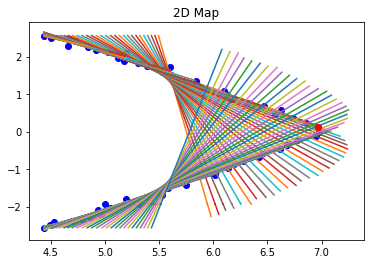

-0.3045451929695369


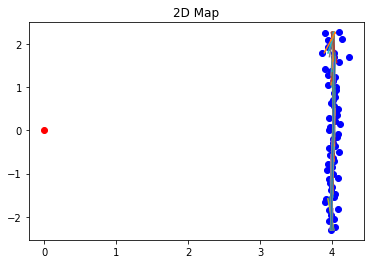

-0.022484674435498925


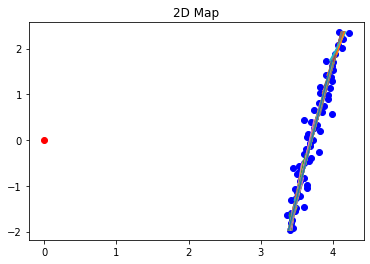

0.06572462432550152


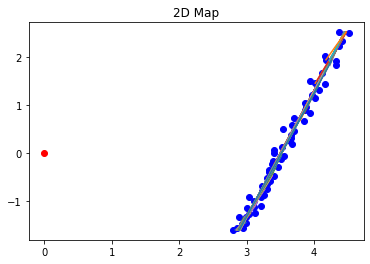

-0.23802719601634342


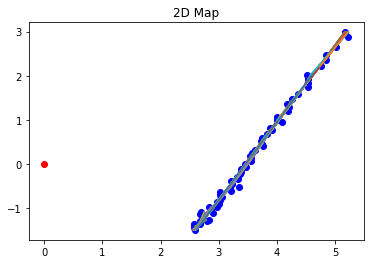

-1.583259227484798


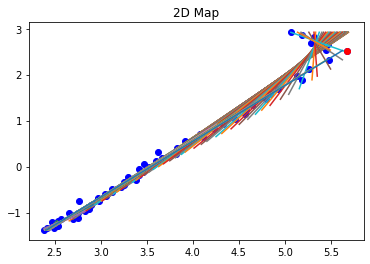

1.6827482855907427


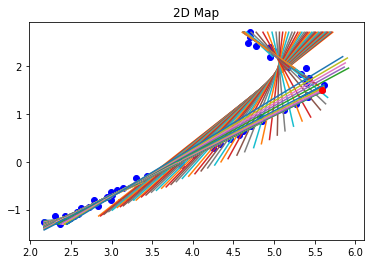

1.3291407207636292


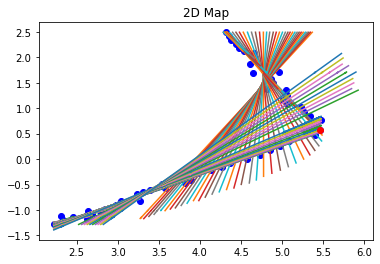

1.144006695972498


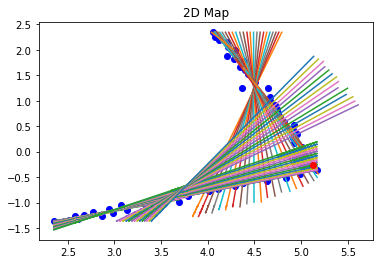

1.0307421612194267


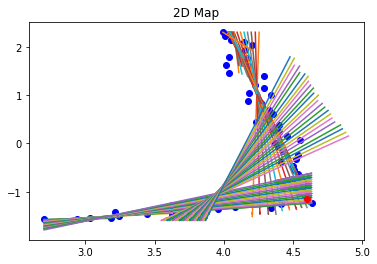

0.9988226504792113


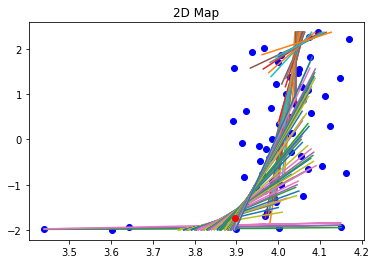

0.04309169577536351


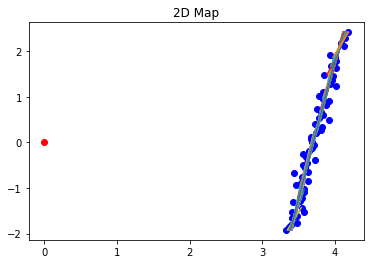

-0.8053851771940412


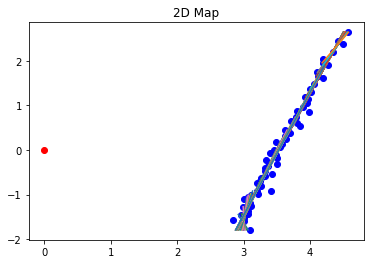

-0.1686692138497633


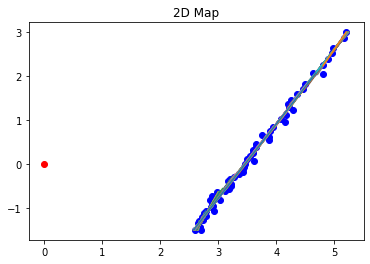

-0.10434628554168801


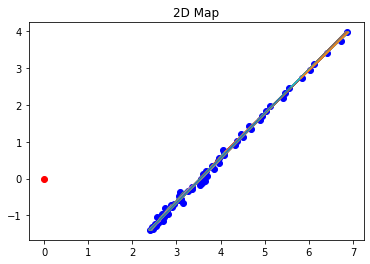

-1.66236954880798


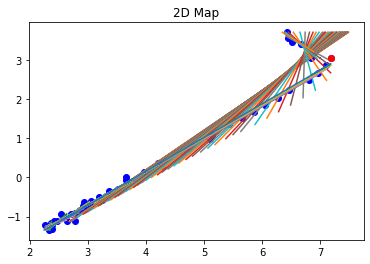

1.3310936067065664


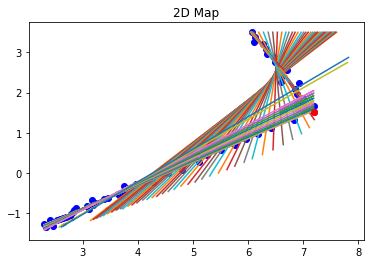

1.137691432533523


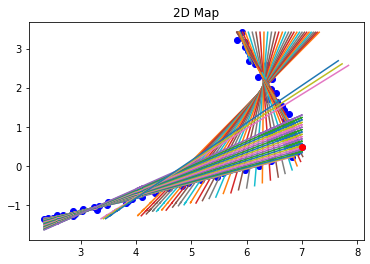

1.029730974935166


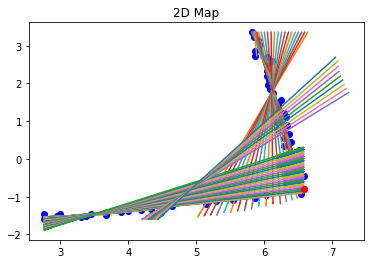

0.9999499335939028


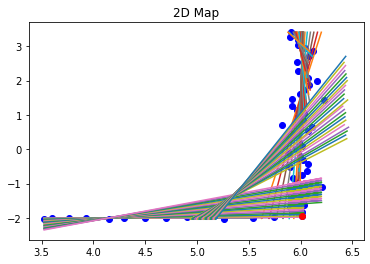

0.08825477683977306


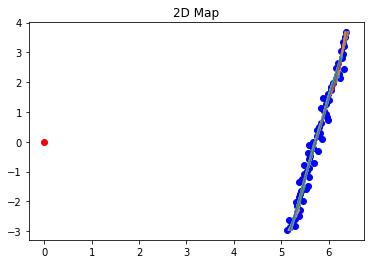

-0.1303299370896628


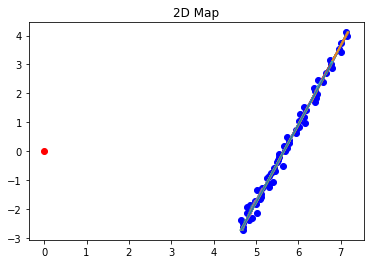

-0.21610203986292637


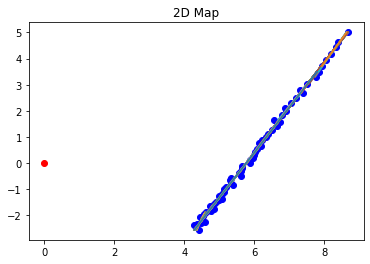

0.5625128071544367


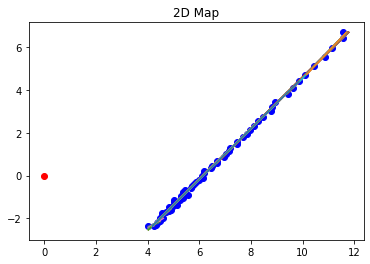

1.6146527415160148


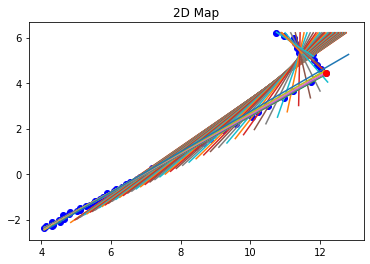

1.316058700647607


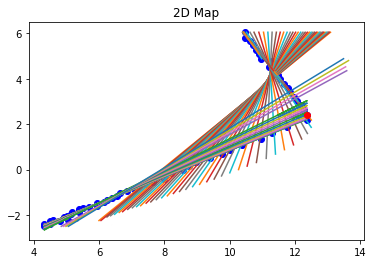

1.1337852883179254


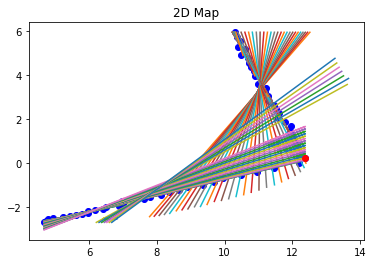

1.0294245244475628


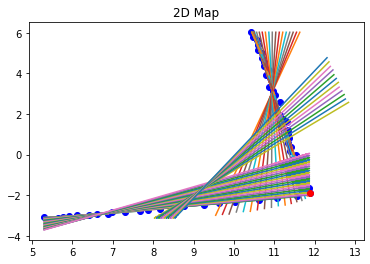

0.9998967496576505


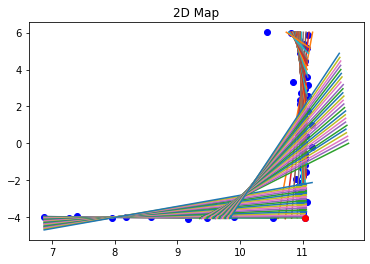

-1.0321297092411807


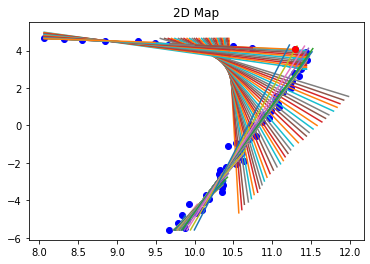

-1.135336442000026


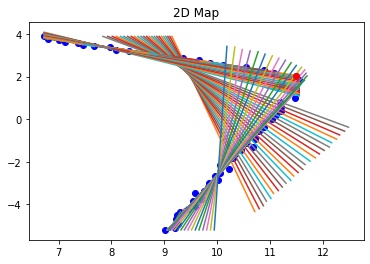

-1.3238821608728497


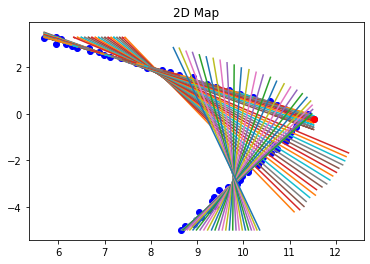

-1.695133270874003


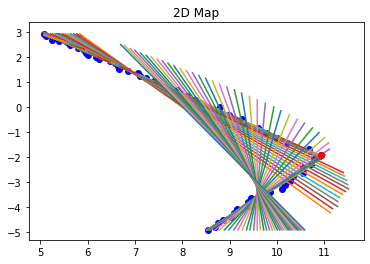

1.7415693169713515


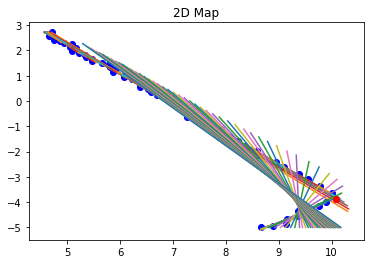

-0.14585914350308926


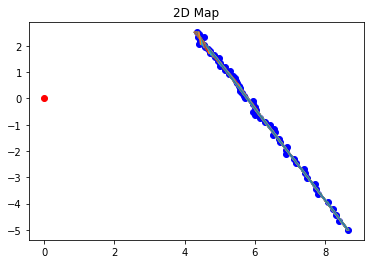

-0.18660705111926237


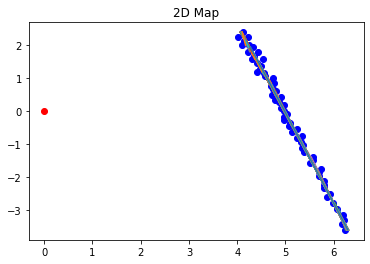

-0.0723653090012846


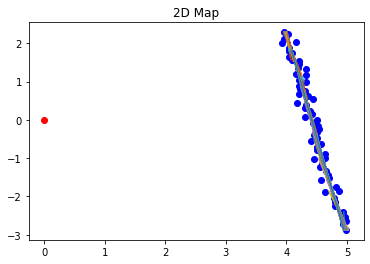

0.046439760736599764


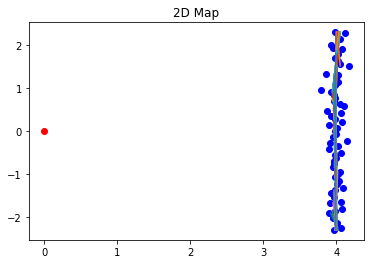

0.027774849907899607


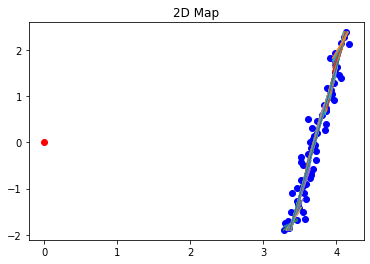

-0.2818491598939398


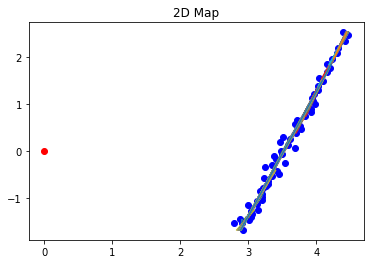

-0.28861298638206095


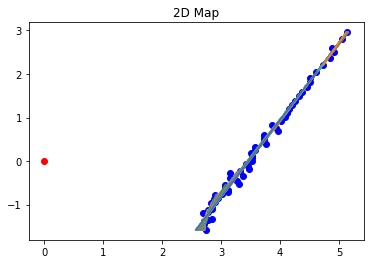

1.6783320260832246


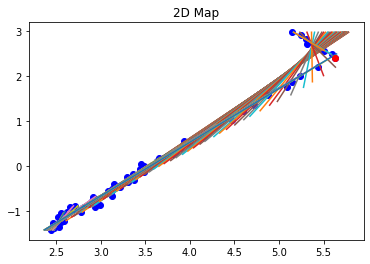

1.6514232534813689


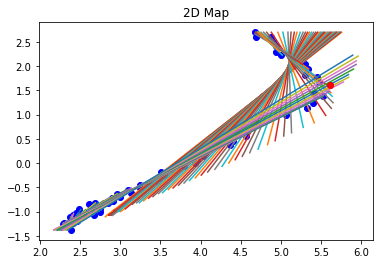

1.3020893437920584


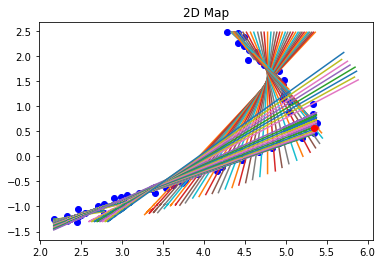

1.1295005218724465


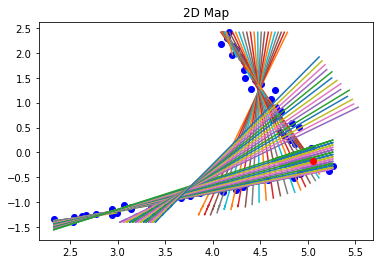

1.039087497682628


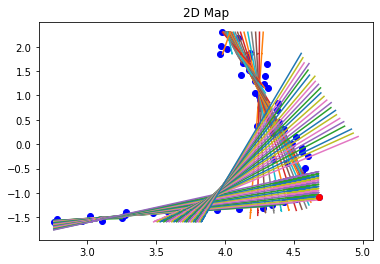

1.0000442738402364


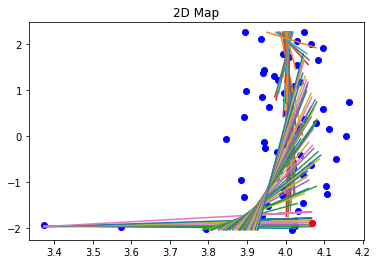

0.04179654485316878


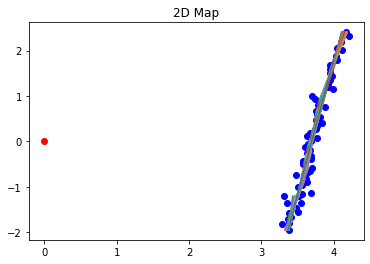

0.3464712273180805


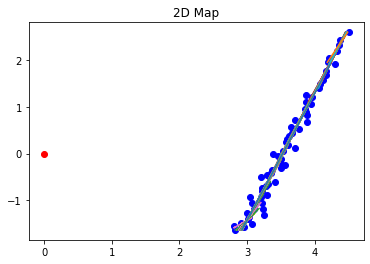

-0.008217001014052205


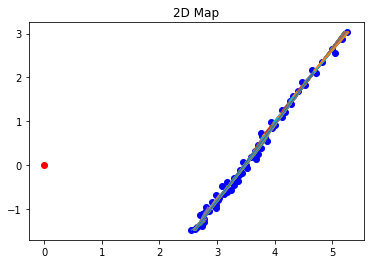

0.13274707096319083


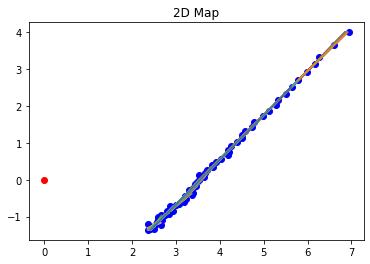

1.6977751543709028


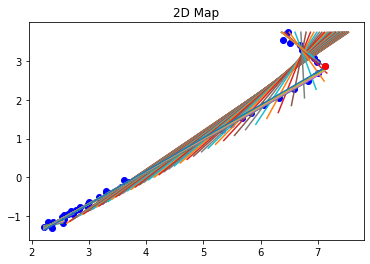

1.3048190886421125


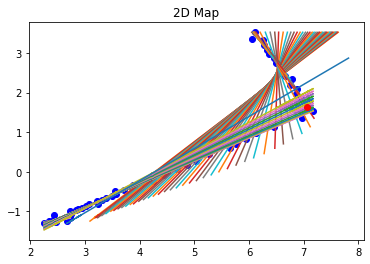

1.131988186209572


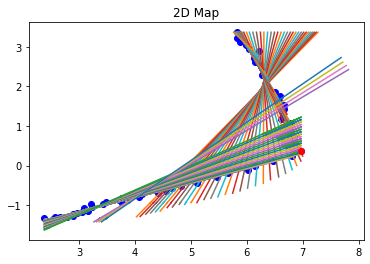

1.0360741538195972


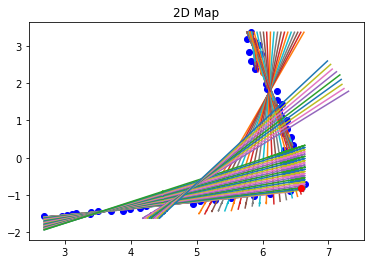

1.0000310372134857


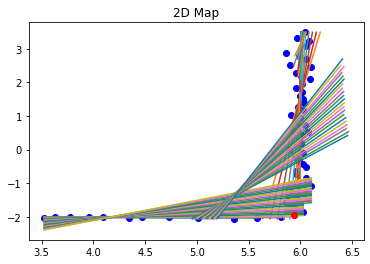

0.2758267094077843


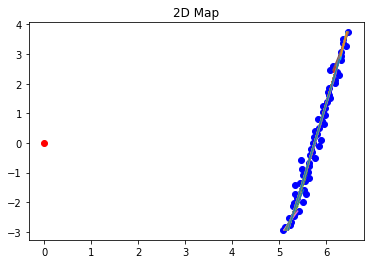

-0.18827225592480082


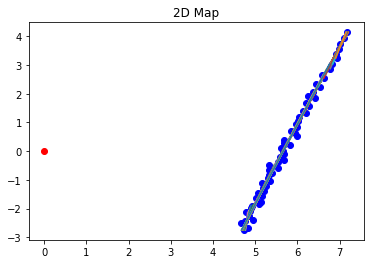

-0.07324969072343751


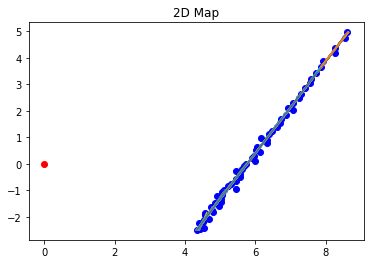

0.4004974926026966


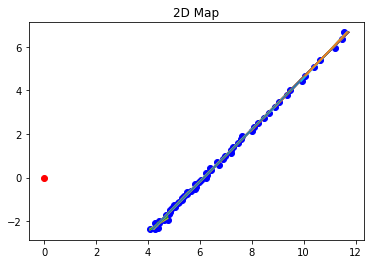

1.6778390930704674


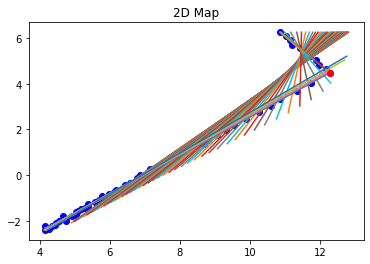

1.3305481705309


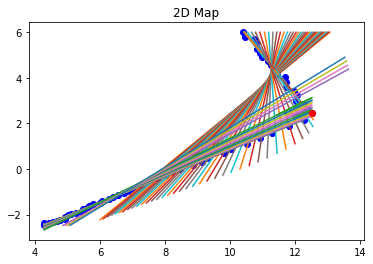

1.1305849689265859


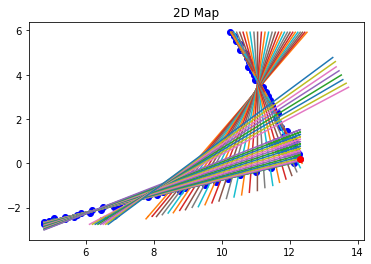

1.030754432489308


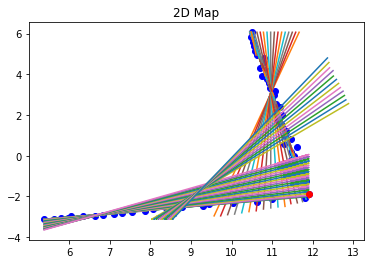

0.9999500294989958


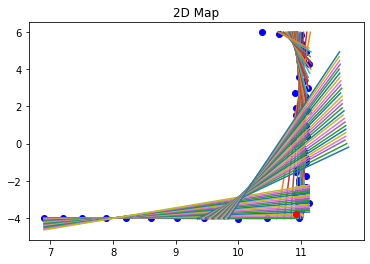

-1.0326313829416645


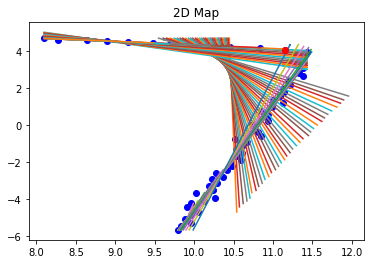

-1.1321633278847174


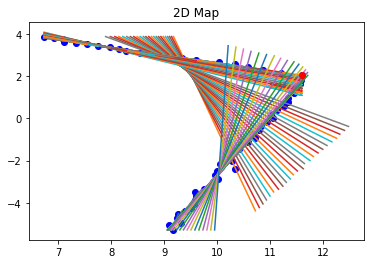

-1.3341347455875208


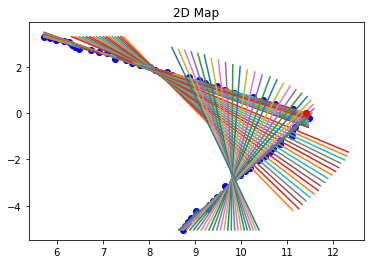

-1.6964936529538237


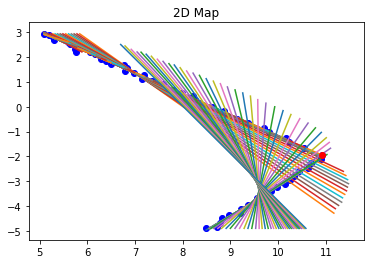

1.5913518549414043


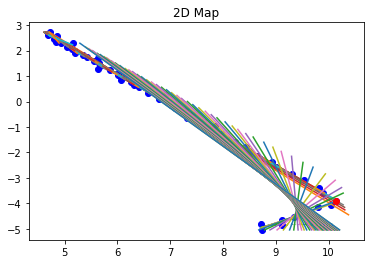

-0.5141831345285515


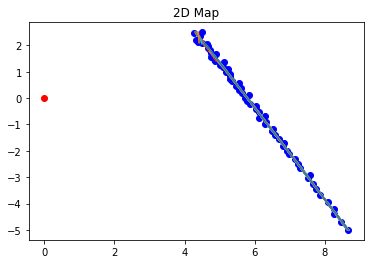

-0.22403395035374707


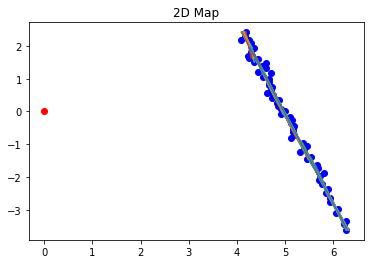

[[6.970024269836987, 0.12166222618125697], [0, 0], [0, 0], [0, 0], [0, 0], [5.668798505809546, 2.5239117060205785], [5.593387648217934, 1.4987437032942121], [5.459748479031013, 0.5738426886314948], [5.130079256263649, -0.2688560613667735], [4.596606492569153, -1.1460627166482646], [3.896693526201669, -1.7349197357210528], [0, 0], [0, 0], [0, 0], [0, 0], [7.185976460818168, 3.0502660374923374], [7.19280759947796, 1.5288784520990404], [7.007451617341706, 0.49000875144910144], [6.586685044959944, -0.8087432310511351], [6.010538423839643, -1.9529423188701882], [0, 0], [0, 0], [0, 0], [0, 0], [12.166047191417968, 4.428079046354071], [12.353392324205757, 2.4012562188786335], [12.391839375347535, 0.21630036087673446], [11.873319577939823, -1.8805490761463581], [11.04150199704154, -4.018778068513949], [11.288515237497048, 4.108683535509395], [11.49153357161863, 2.0262674183934757], [11.528574874740288, -0.20123202296840964], [10.93391375609255, -1.927943999938551], [10.082821713359724, -3.8704

In [ ]:
corner = []
residuals1 = float
residuals2 = float

for t in range(len(Lidar_range)):  
  x_o, y_o = [], []
  corner_prob = []
  vector1 = []
  vector2 = []
  for i in range(len(angle)):
    if Lidar_range[t][i] > 0:
      x_o.append(Lidar_range[t][i]*np.cos(angle[i]/180*np.pi))
      y_o.append(Lidar_range[t][i]*np.sin(angle[i]/180*np.pi))    
      

  for j in range(5,len(angle)-5) :#range(2,len(angle)-2):
    x_1 = x_o[:j]
    y_1 = y_o[:j]
    x_2 = x_o[j:]
    y_2 = y_o[j:]

    #print(j,len(x_2),len(x_1),len(x_o))
    dy = abs(y_o[j]-y_o[0])
    dx = abs(x_o[j]-x_o[0])
    if dx>dy:
      coefs1,resid1, rank, singular_values, rcond = np.polyfit(x_1,y_1,1,full=1)
      #print(resid1)
      residuals1f = resid1[0]
      vals1=np.polyval(coefs1,x_1)
      plt.plot(x_1,vals1)
      vector1.append([1,coefs1[0]])
      #print('1 horizontal')
    else:
      coefs1,resid1, rank, singular_values, rcond = np.polyfit(y_1,x_1,1,full=1)
      #print(resid1)
      residuals1f = resid1
      vals1=np.polyval(coefs1,y_1)
      plt.plot(vals1,y_1)
      vector1.append([coefs1[0],1])
      #print('1 vertical')

    dy = abs(y_o[-1]-y_o[j])
    dx = abs(x_o[-1]-x_o[j])
    if dx>dy:
      coefs2,resid2, rank, singular_values, rcond = np.polyfit(x_2,y_2,1,full=1)
      residuals2f = resid2
      vals2=np.polyval(coefs2,x_2)    
      plt.plot(x_2,vals2)
      vector2.append([1,coefs2[0]])
      #print('2 horizontal')
    else:

      coefs2,resid2, rank, singular_values, rcond = np.polyfit(y_2,x_2,1,full=1)
      residuals2f = resid2
      vals2=np.polyval(coefs2,y_2)
      plt.plot(vals2,y_2)
      vector2.append([coefs2[0],1]) 
      #print('2 vertical')
    #print(residuals1f,residuals2f)
    corner_prob.append(residuals2f+residuals1f)
  
    
    #print(corner_prob[j-2])
  
  max_prob = min(corner_prob)
  max_prob_index = corner_prob.index(max_prob)

  print(np.cross(vector1[max_prob_index],vector2[max_prob_index]))

  if(abs(np.cross(vector1[max_prob_index],vector2[max_prob_index]))>0.95):
    corner.append([x_o[max_prob_index+5],y_o[max_prob_index+5]])
    
  else:
    corner.append([0,0])


  
  plt.scatter(x_o, y_o, color='b')
  plt.scatter(corner[t][0],corner[t][1],color='r',zorder=1000)
  plt.title('2D Map');
  plt.show()

print(corner)


 


<h3> Corner Detection function and update </h3>

In [ ]:
def detect_corner(lidar_data):
  corner = []
  residuals1 = float
  residuals2 = float
  x_o, y_o = [], []
  corner_prob = []
  vector1 = []
  vector2 = []
  for i in range(len(angle)):
    if lidar_data[i] > 0:
      x_o.append(lidar_data[i]*np.cos(angle[i]/180*np.pi))
      y_o.append(lidar_data[i]*np.sin(angle[i]/180*np.pi))    
      

  for j in range(5,len(angle)-5) :
    x_1 = x_o[:j]
    y_1 = y_o[:j]
    x_2 = x_o[j:]
    y_2 = y_o[j:]

    dy = abs(y_o[j]-y_o[0])
    dx = abs(x_o[j]-x_o[0])
    if dx>dy:
      coefs1,resid1, rank, singular_values, rcond = np.polyfit(x_1,y_1,1,full=1)
      residuals1f = resid1[0]
      vector1.append([1,coefs1[0]])
    else:
      coefs1,resid1, rank, singular_values, rcond = np.polyfit(y_1,x_1,1,full=1)
      residuals1f = resid1
      vector1.append([coefs1[0],1])

    dy = abs(y_o[-1]-y_o[j])
    dx = abs(x_o[-1]-x_o[j])
    if dx>dy:
      coefs2,resid2, rank, singular_values, rcond = np.polyfit(x_2,y_2,1,full=1)
      residuals2f = resid2
      vector2.append([1,coefs2[0]])
    else:
      coefs2,resid2, rank, singular_values, rcond = np.polyfit(y_2,x_2,1,full=1)
      residuals2f = resid2
      vector2.append([coefs2[0],1]) 

    corner_prob.append(residuals2f+residuals1f)
  
    
    #print(corner_prob[j-2])
  
  max_prob = min(corner_prob)
  max_prob_index = corner_prob.index(max_prob)

  if(abs(np.cross(vector1[max_prob_index],vector2[max_prob_index]))>0.98):
    corner.append([x_o[max_prob_index+5],y_o[max_prob_index+5]])
    
  else:
    return -1
  return corner

In [ ]:
def to_polar(x,y):
  r=np.sqrt(x**2+y**2)
  ang=np.arctan2(y, x)
  return(ang/np.pi*180,r)

In [ ]:
def corner_to_index(corner_coord):
  corner_polar = to_polar(corner_coord[0],corner_coord[1])
  index_corner=round(corner_polar[0])+30
  return index_corner

<h4> Example of corner detection </h4>

In [ ]:
#Example of detection

corner_ex=detect_corner(Lidar_range[5])
if corner_ex != -1:
  x_aux=corner_to_index(corner_ex[0])
  print(x_aux)
else:
  print("Not an corner")

54


<h3> 1.2 - Using the exact location of the robot build a map with the four corners of the room </h3>

In [ ]:
#Update corner positioin (x,y) to polar coordinates and find the index of the corner in Lidar_range

index_corner = []

for t in range(len(Lidar_range)):

  if ((corner[t][0] != 0) and (corner[t][1] != 0)):
    corner_polar = to_polar(corner[t][0],corner[t][1])
    index_corner.append(round(corner_polar[0])+30)
  else:
    index_corner.append(-1)

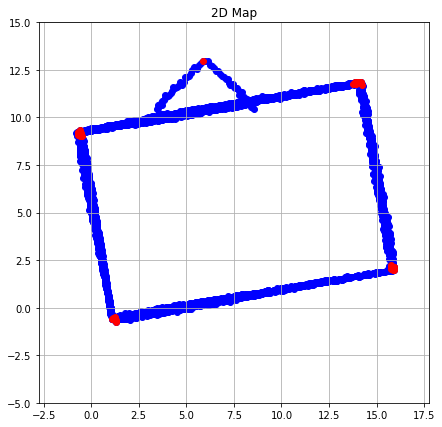

In [ ]:
#Plot the map and the known corners

border_x, border_y = [], []
corner_x, corner_y = [], []

for t in range(len(Lidar_range)):  
  for i in range(len(angle)):
    if Lidar_range[t][i] > 0:
      border_x.append(px[t]+Lidar_range[t][i]*np.cos(th[t] + angle[i]/180*np.pi))
      border_y.append(py[t]+Lidar_range[t][i]*np.sin(th[t] +angle[i]/180*np.pi))    
      
for t in range(len(Lidar_range)):
  if (index_corner[t]!= -1):
    corner_x.append(px[t]+Lidar_range[t][index_corner[t]]*np.cos(th[t] + angle[index_corner[t]]/180*np.pi))
    corner_y.append(py[t]+Lidar_range[t][index_corner[t]]*np.sin(th[t] + angle[index_corner[t]]/180*np.pi))
        
fig, ax = plt.subplots(figsize=(7,7))

ax.axis('equal')
plt.xlim(-3,18)
plt.ylim(-5,15)
#plt.plot(px[t], py[t], 'g.', ms=15)  #position of the robot
plt.grid()

plt.scatter(border_x, border_y, color='b')
plt.scatter(corner_x, corner_y, color='r')
plt.title('2D Map');
plt.show()

<h2> <b>Task 2</b> </h2>

<h3> 2.1 - Considering that the initial pose of the robot is known (pose at the initial instant) design and implement
a procedure to estimate in real time the evolution of the robot based only on the variations of the robot
pose. </h3>

Erro:  0.0 0.0


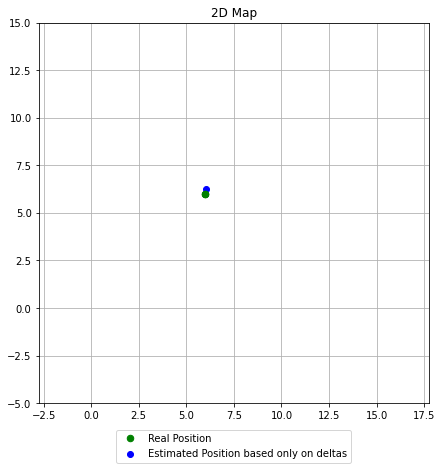

Erro:  0.01385360999999996 0.25916010999999983


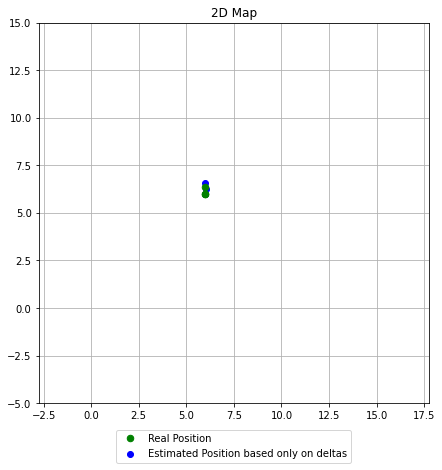

Erro:  0.00199730599999981 0.23998909999999984


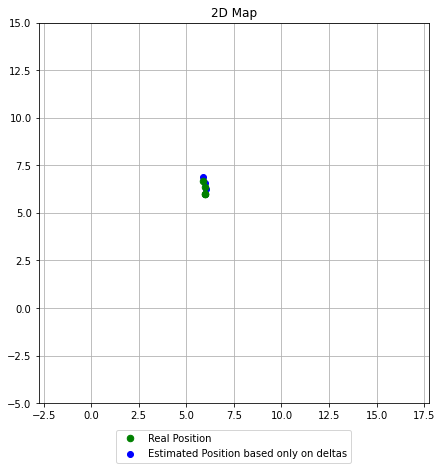

Erro:  -0.009894543999999783 0.19175396999999972


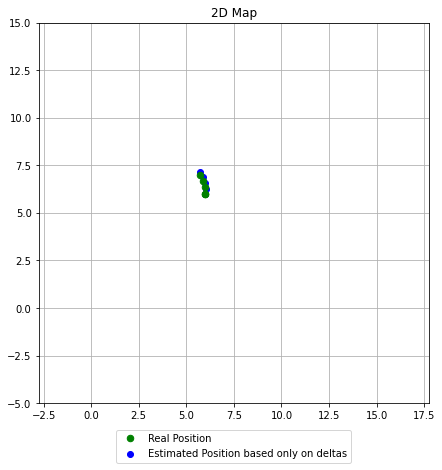

Erro:  -0.033584443999999714 0.15870359999999994


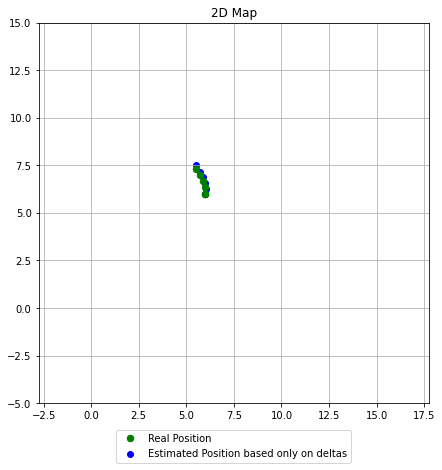

Erro:  -0.0429635639999999 0.23781604999999928


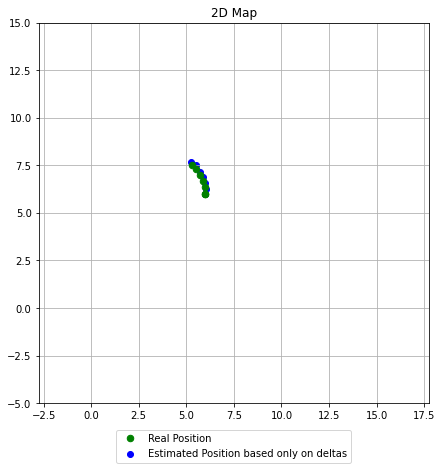

Erro:  -0.04483612400000059 0.12341872000000009


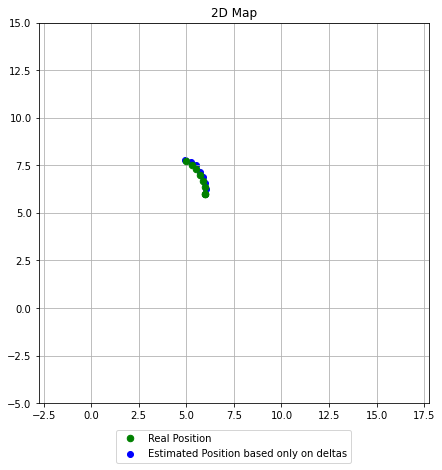

Erro:  -0.04940180400000038 0.04760285000000053


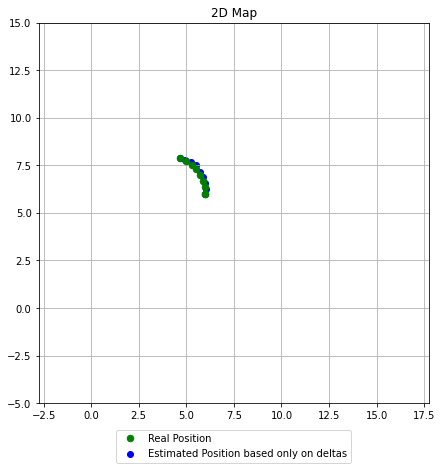

Erro:  -0.025925454000001125 -0.01479126899999983


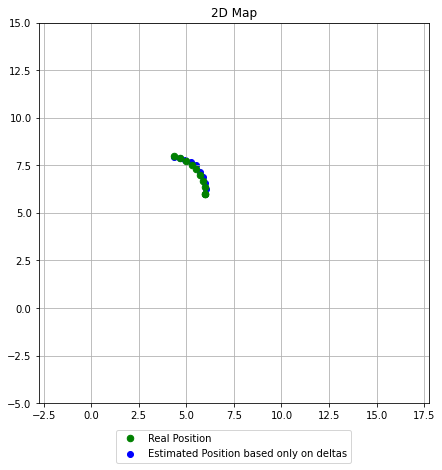

Erro:  0.0023139159999994163 -0.055788519000000036


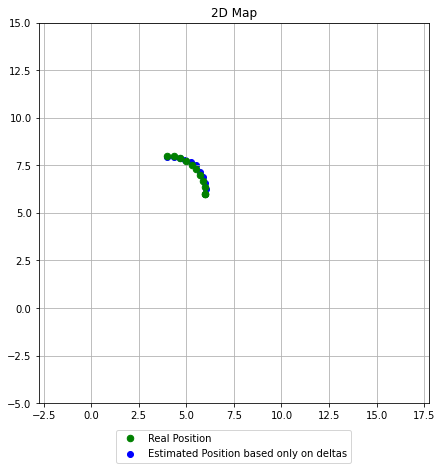

Erro:  0.007147906000000148 -0.058368386000000605


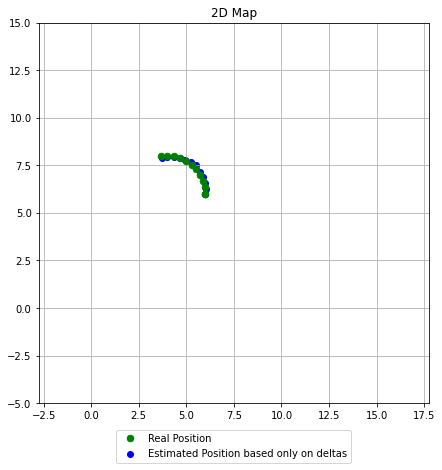

Erro:  0.045858465999999876 -0.06855471099999999


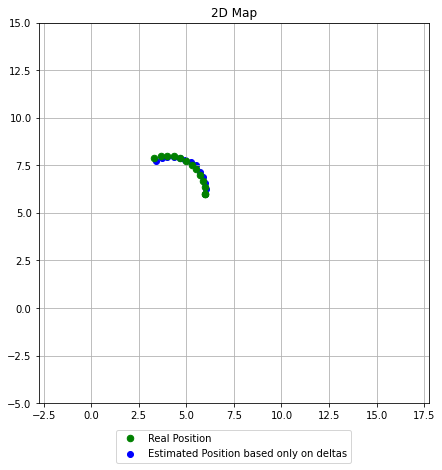

Erro:  0.08401416599999978 -0.15459310099999968


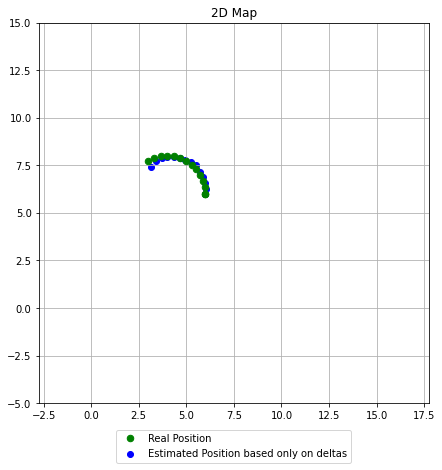

Erro:  0.13037607599999967 -0.32906501099999996


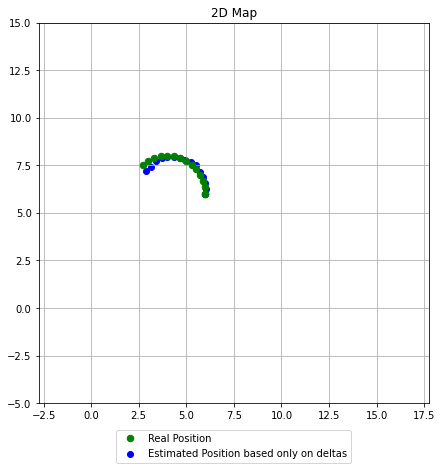

Erro:  0.17899603599999958 -0.32753501100000015


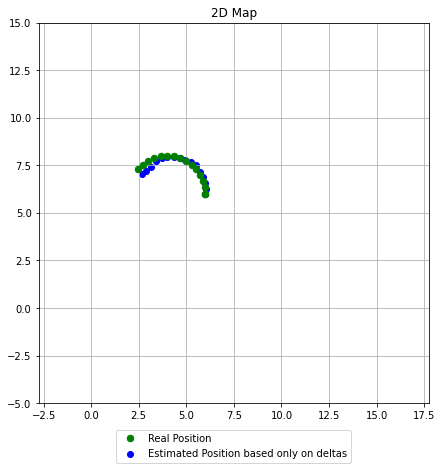

Erro:  0.2095988160000002 -0.2342445910000004


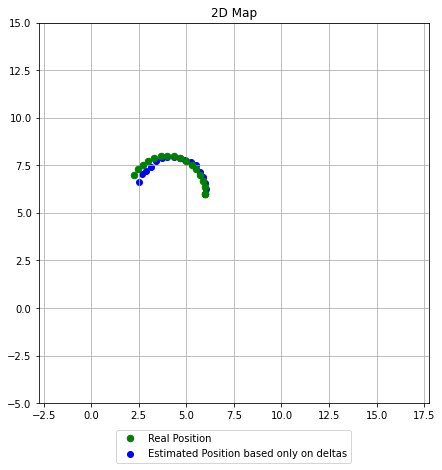

Erro:  0.2451903660000001 -0.36788274099999985


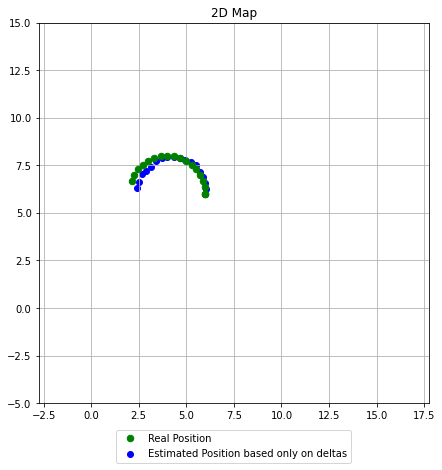

Erro:  0.29699782100000016 -0.3695226610000004


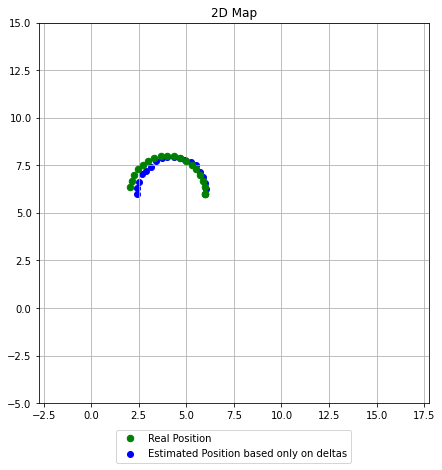

Erro:  0.37462583400000016 -0.3473090810000006


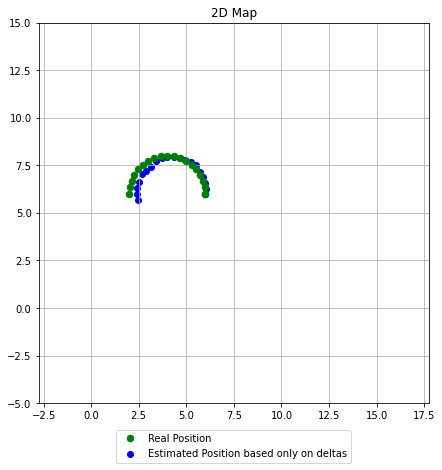

Erro:  0.43852890600000016 -0.30022541100000044


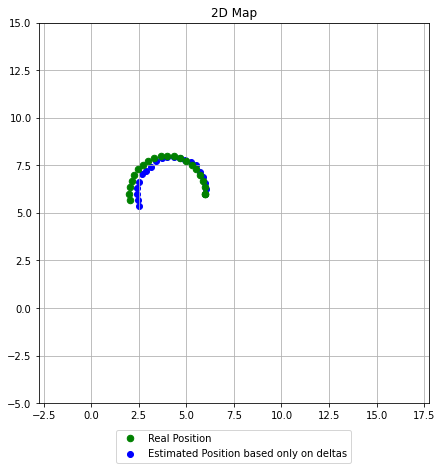

Erro:  0.49475870800000044 -0.29941696100000037


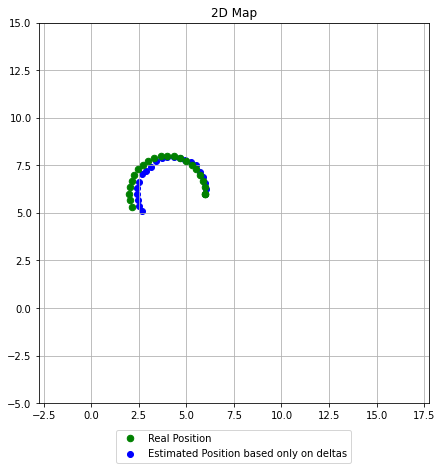

Erro:  0.5644995680000005 -0.1987552310000007


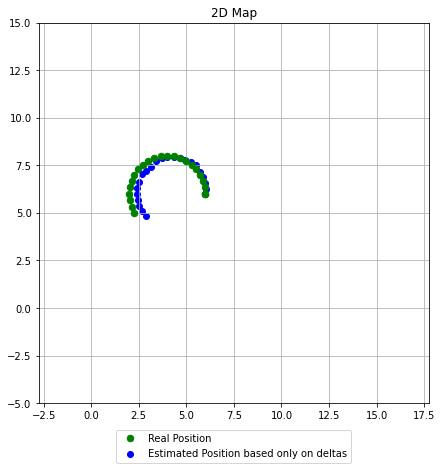

Erro:  0.6193958780000002 -0.16943231100000133


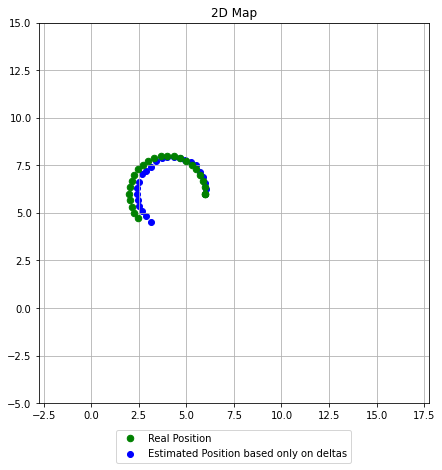

Erro:  0.6622337980000004 -0.18476012100000094


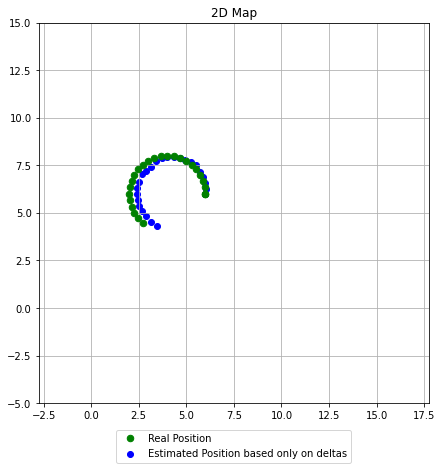

Erro:  0.7303176480000002 -0.17724520100000163


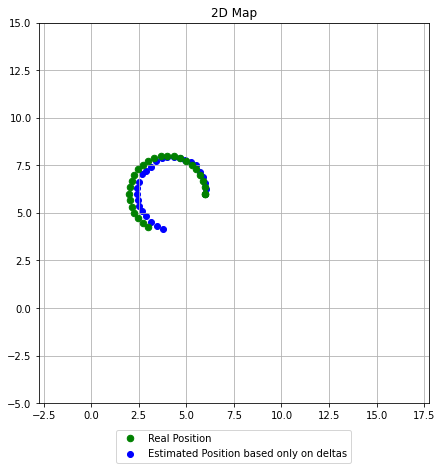

Erro:  0.7795297080000005 -0.13371268100000133


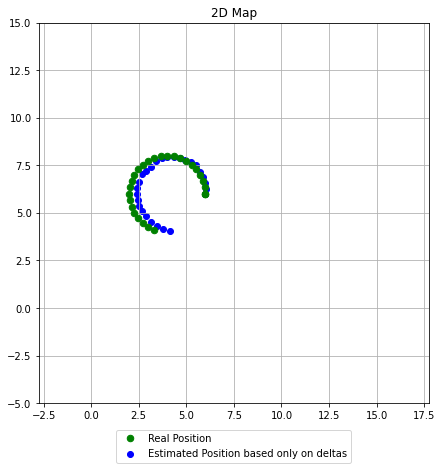

Erro:  0.8414596780000001 -0.08400869100000108


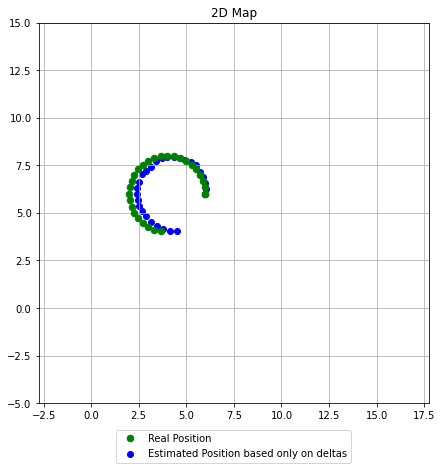

Erro:  0.8524670980000004 0.0035618188999988476


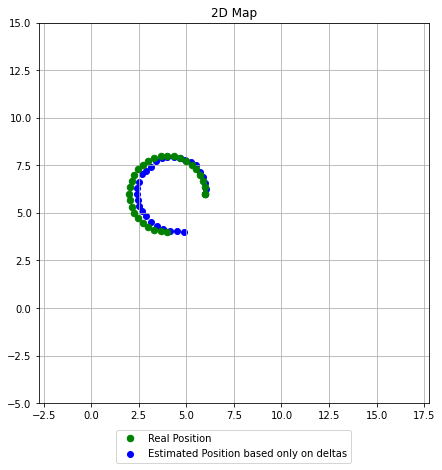

Erro:  0.8556007680000004 0.003723323899999187


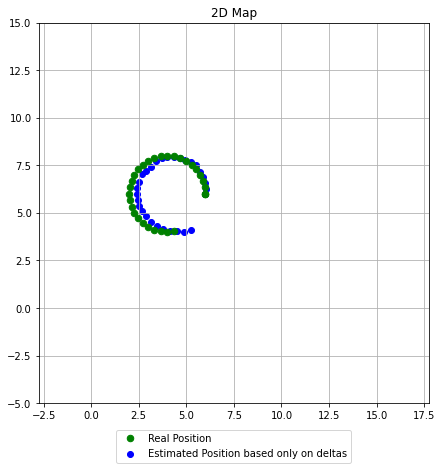

Erro:  0.8795302380000001 0.07939717389999856


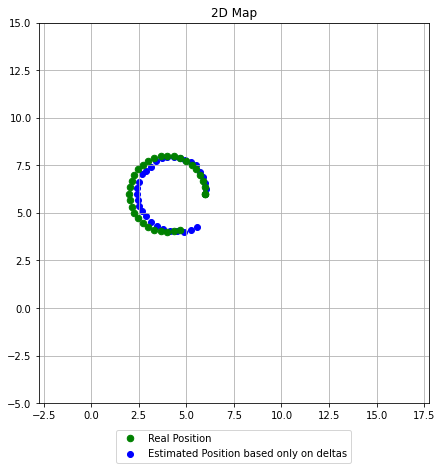

Erro:  0.8956501279999998 0.11903200389999835


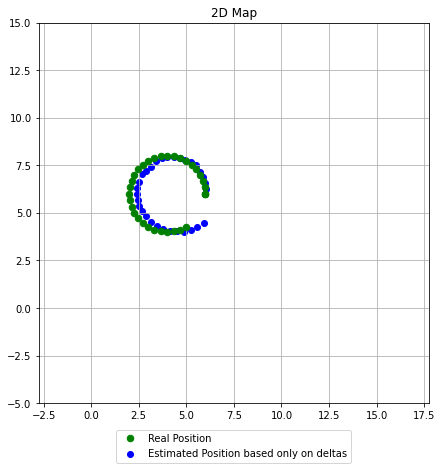

Erro:  0.9091925779999999 0.2241714238999979


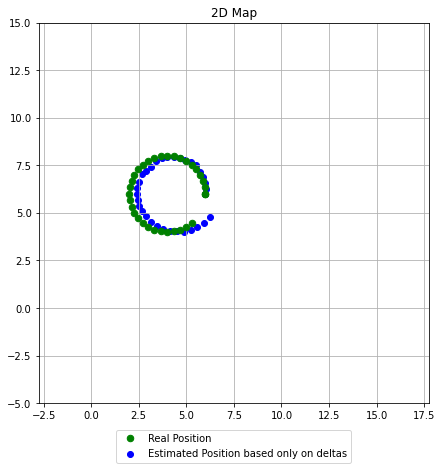

Erro:  0.9338644479999996 0.304797493899998


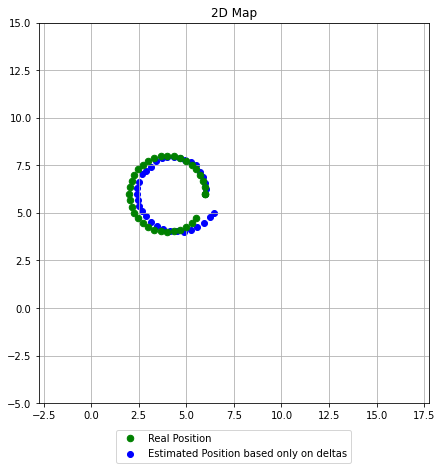

Erro:  0.919826048 0.2805129038999983


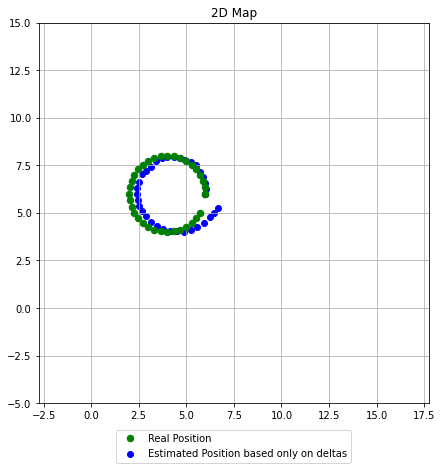

Erro:  0.9408404480000003 0.23214898389999838


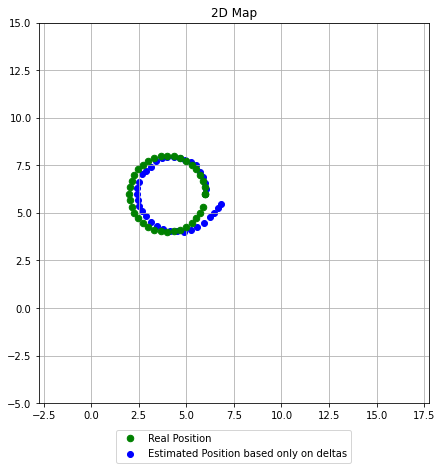

Erro:  0.9562140880000003 0.17335796389999913


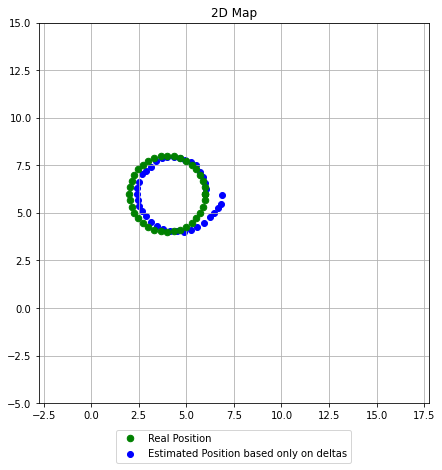

Erro:  0.929403615 0.2863019038999992


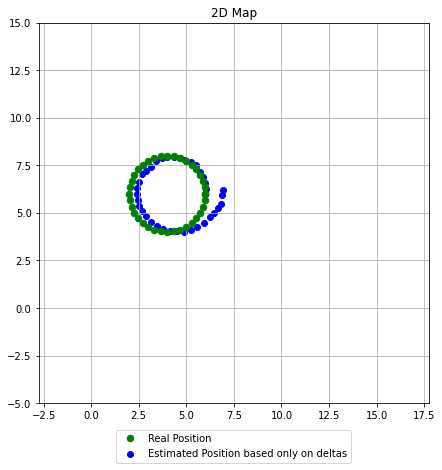

Erro:  0.9143464309999993 0.19853683389999865


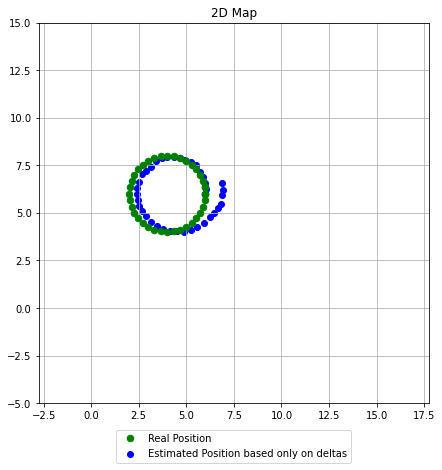

Erro:  0.884729342 0.20150988389999824


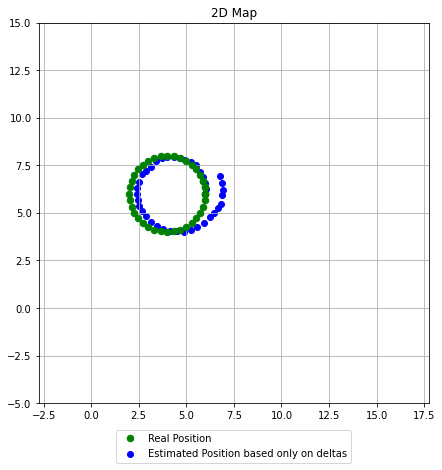

Erro:  0.8807746940000003 0.27346062389999837


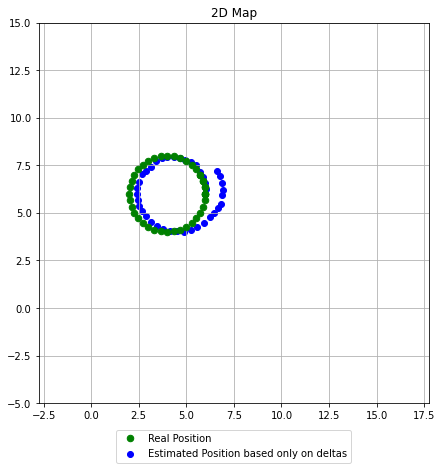

Erro:  0.894392184 0.2144740538999983


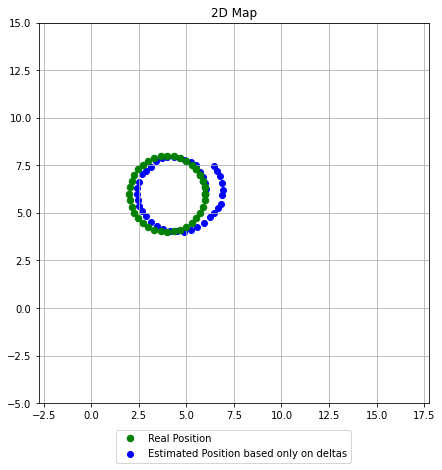

Erro:  0.9047478739999999 0.15728565389999805


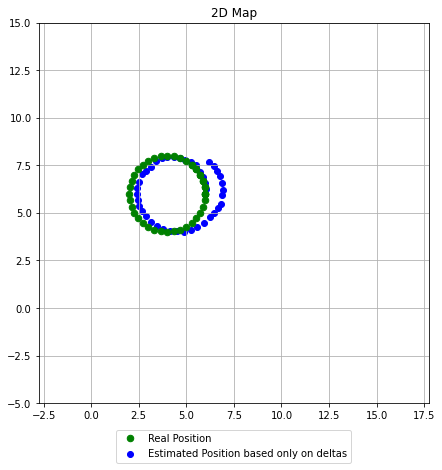

Erro:  0.8854977439999994 0.11729203389999832


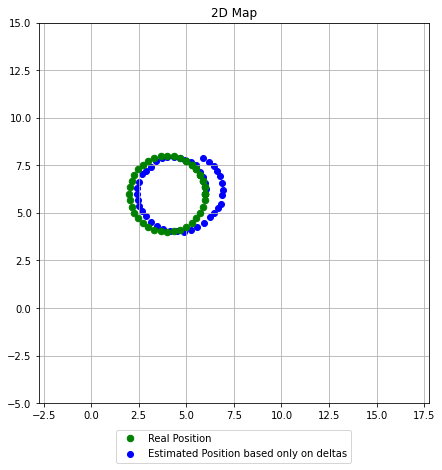

Erro:  0.8759326139999999 0.13288833389999866


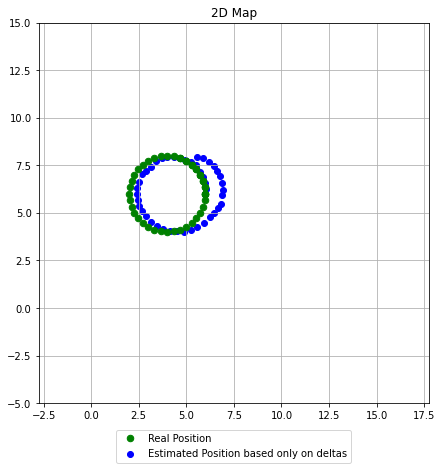

Erro:  0.8745444939999993 0.06010435989999863


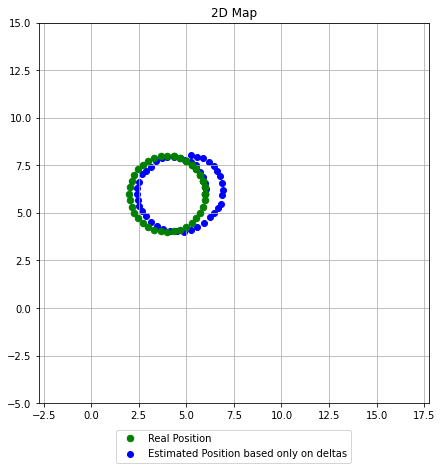

Erro:  0.8808215439999998 0.09495590989999947


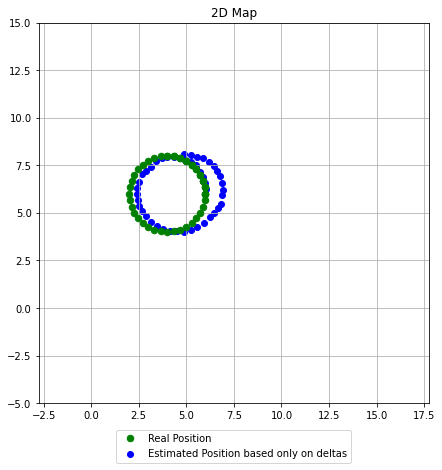

Erro:  0.8871544240000002 0.07494705189999884


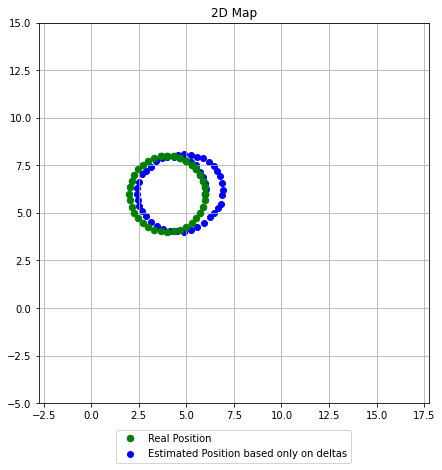

Erro:  0.9195836439999998 0.08178974589999832


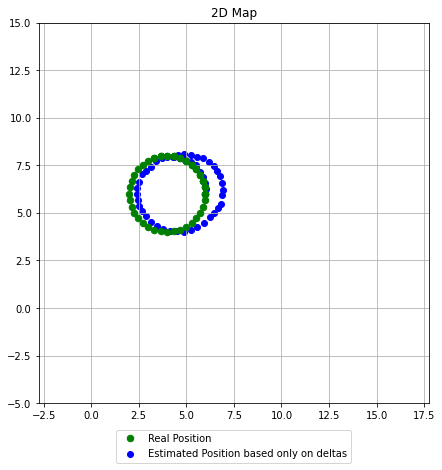

Erro:  0.9732873840000003 0.07345124489999844


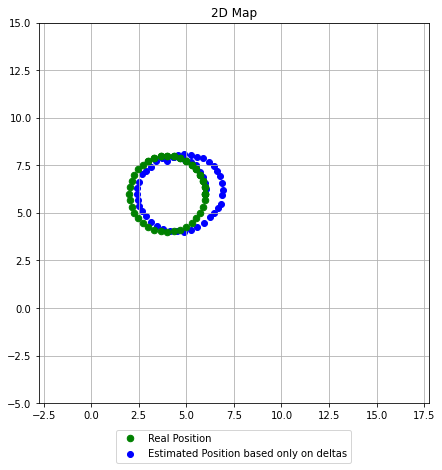

Erro:  0.9884056040000004 -0.02883716510000145


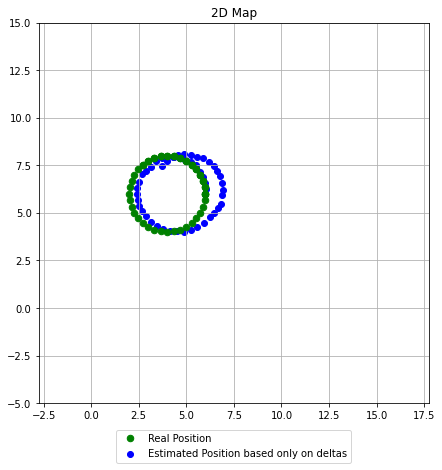

Erro:  1.0123943840000003 -0.05170477510000193


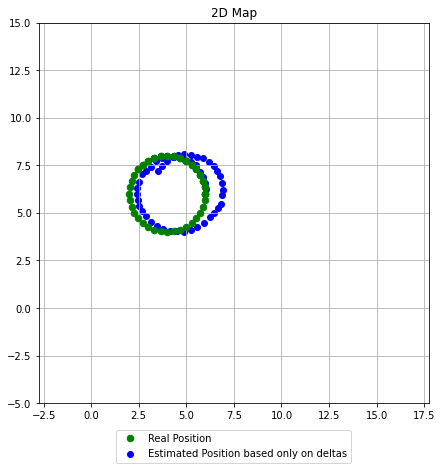

Erro:  1.0635642740000004 -0.09639696510000206


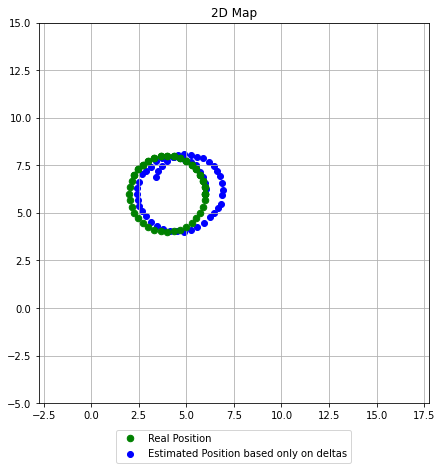

Erro:  1.1359600440000004 -0.11379594510000146


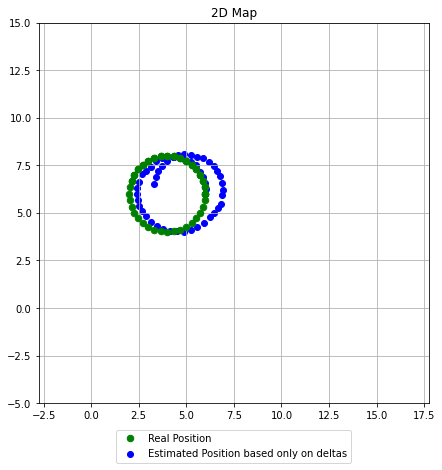

Erro:  1.1928321730000007 -0.15280485510000208


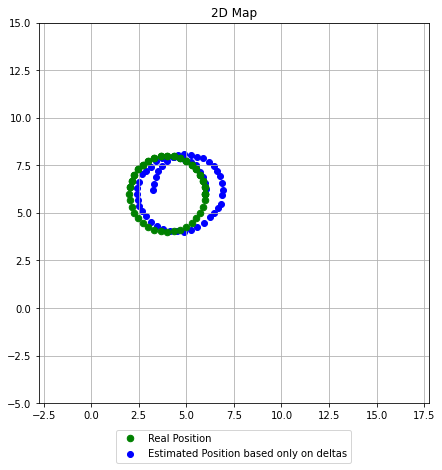

Erro:  1.2446819550000008 -0.13712456510000237


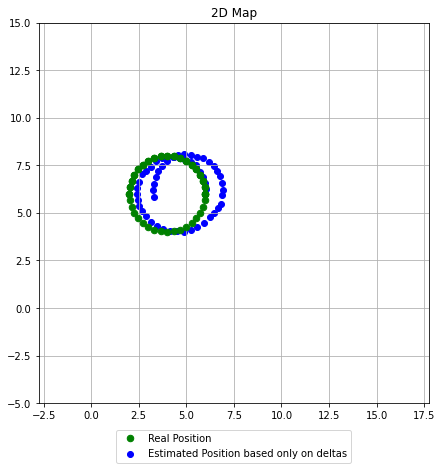

Erro:  1.2909721720000005 -0.1757362251000023


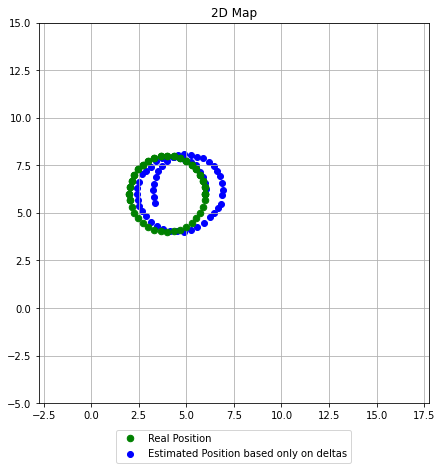

Erro:  1.3420918640000008 -0.11710957510000242


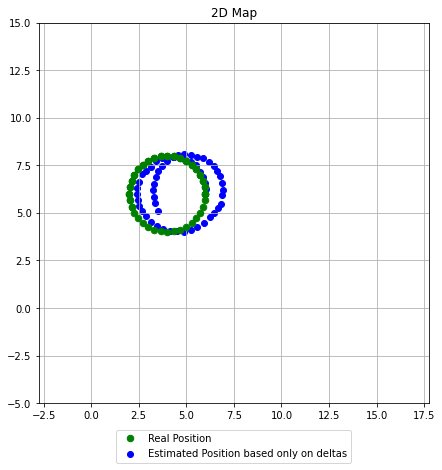

Erro:  1.381606784000001 -0.19687398510000254


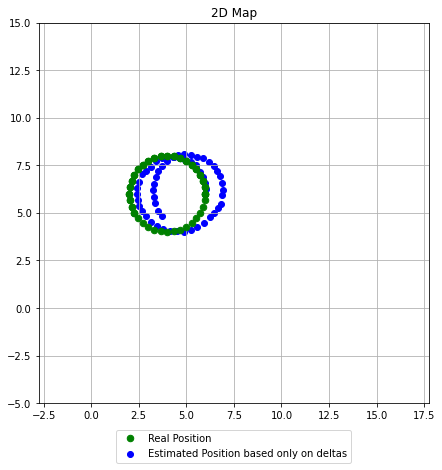

Erro:  1.451990454000001 -0.15541434510000318


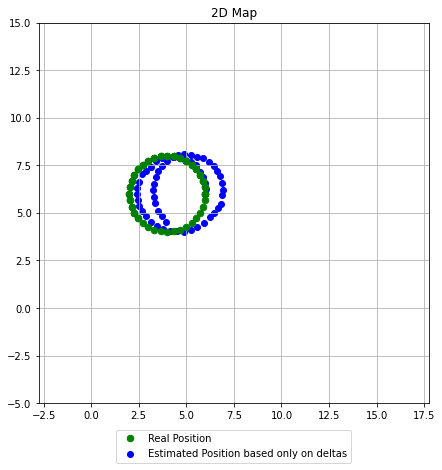

Erro:  1.4808077140000013 -0.1831720351000028


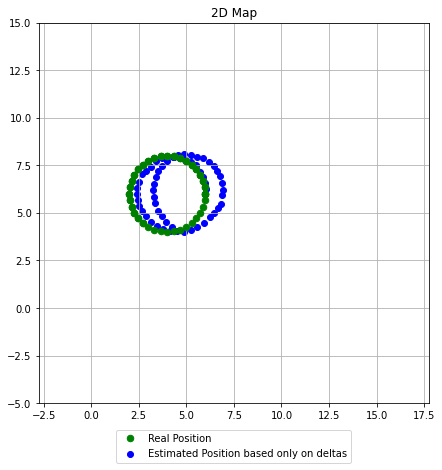

Erro:  1.5290591040000012 -0.20061496510000332


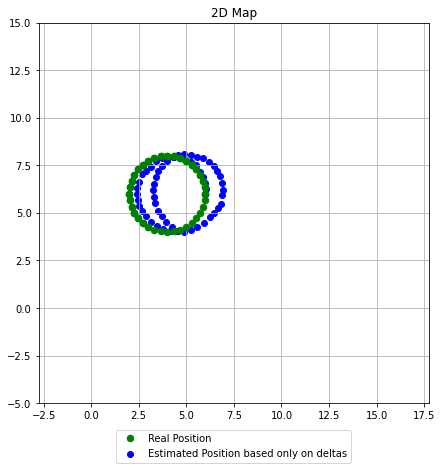

Erro:  1.553561494000001 -0.20669274510000335


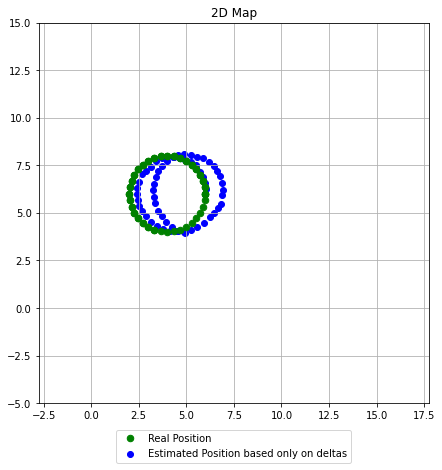

Erro:  1.5942283640000015 -0.16431402510000304


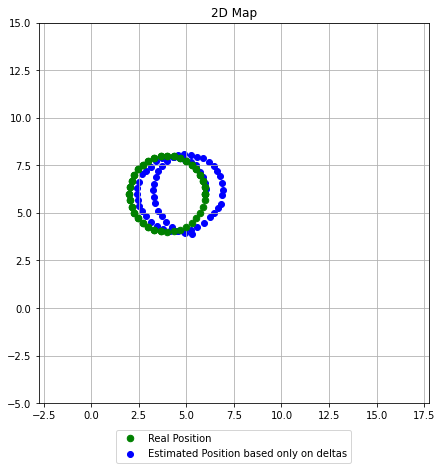

Erro:  1.647006434000001 -0.13932072110000293


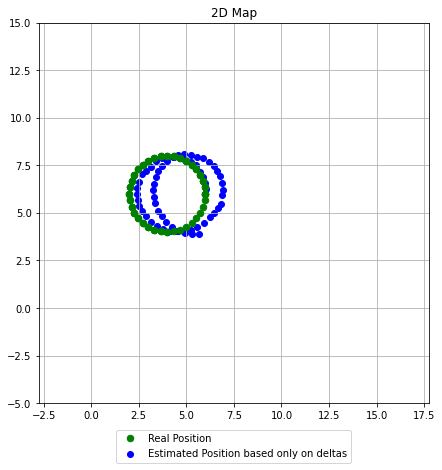

Erro:  1.6834414540000013 -0.08839957610000271


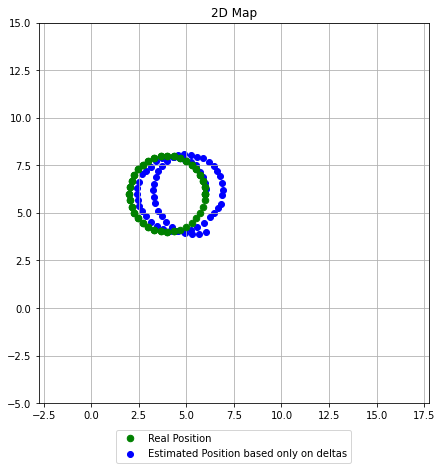

Erro:  1.6897343540000014 -0.06026975410000279


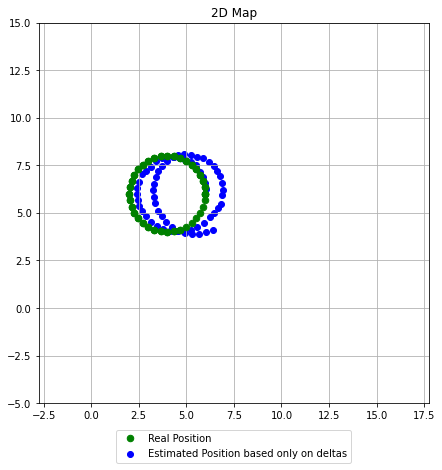

Erro:  1.7111044740000017 -0.01850144410000265


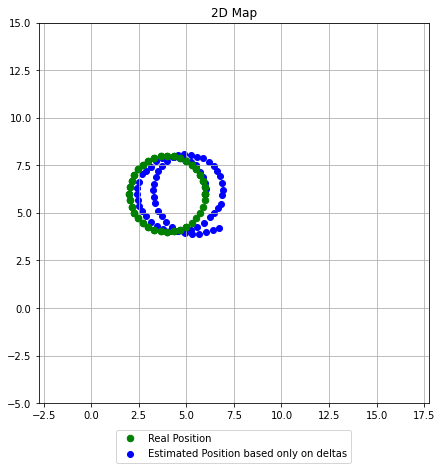

Erro:  1.7022678140000025 -0.0785062561000025


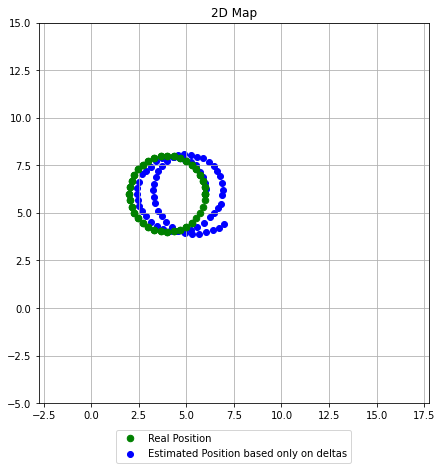

Erro:  1.6861665540000024 -0.06650948610000285


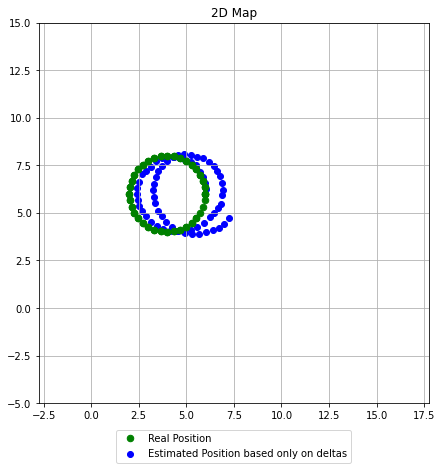

Erro:  1.7045201040000029 -0.0031240261000027303


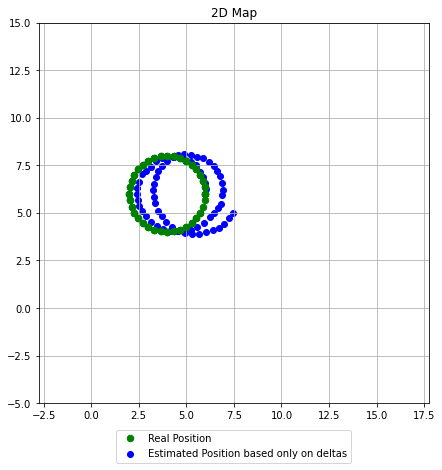

Erro:  1.7286866540000032 0.01658300389999745


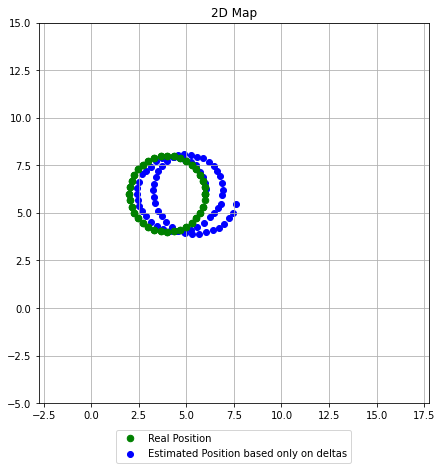

Erro:  1.742227414000003 0.1301396238999981


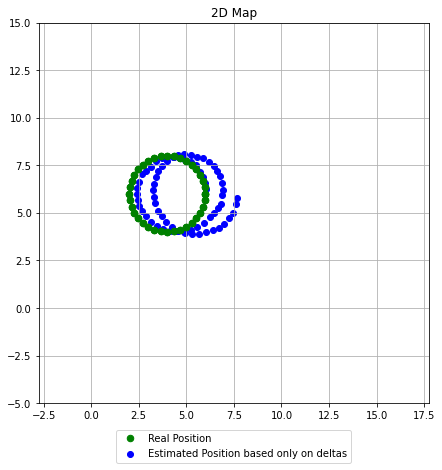

In [ ]:
px_estimated, py_estimated = [], []   #Position estimation with delta_x and delta_y
px_evolution, py_evolution = [], []   #Real Position evalution

px_estimated.append(px[0])
py_estimated.append(py[0])

px_evolution.append(px[0])
py_evolution.append(py[0])

for t in range(len(Lidar_range)):  
  if Lidar_range[t][i] > 0:
    px_estimated.append(px_estimated[t] + x_delta[t])
    py_estimated.append(py_estimated[t] + y_delta[t])
    
    px_evolution.append(px[t])
    py_evolution.append(py[t])

    erro_x=px_estimated[t]-px_evolution[t]
    erro_y=py_estimated[t]-py_evolution[t]
    print("Erro: ", erro_x, erro_y)
  
  fig, ax = plt.subplots(figsize=(7,7))
  ax.axis('equal')
  plt.xlim(-3,18)
  plt.ylim(-5,15)
  plt.plot(px_evolution, py_evolution, 'g.', ms=13, label="Real Position")  #Real Position of the robot
  plt.grid()
  plt.scatter(px_estimated, py_estimated, color='b', label="Estimated Position based only on deltas") #Estimated Position of the robot
  plt.title('2D Map');
  plt.legend(bbox_to_anchor =(0.5,-0.17), loc='lower center')
  plt.show()

<h2> <b>Task 3</b> </h2>

<h3>Design and implement a system that processes the variations of the robot pose and also the LIDAR
readings to estimate in real time the pose fo the robot as well as the locations of the rooms corners.
</h3>

In [ ]:
def check_known_corner(x_corner, y_corner, known_cor):
  threshold = 3

  if(len(known_cor) == 0):
    known_cor.append([x_corner, y_corner])
    return 0
  else:
    for i in range(1, len(known_cor)+1):
      if  ( abs(known_cor[i-1][0] - x_corner) < threshold) and ( abs(known_cor[i-1][1] - y_corner) < threshold):
        known_cor[i-1][0]=x_corner
        known_cor[i-1][1]=y_corner
        return i
      else:
        return 0

In [ ]:
def kf_predict(X, P, Q, U): 
  """      
    X : The mean state estimate of the previous step (k−1) - shape(m,1) 
    P : The state covariance of previous step (k−1) - shape(m,m) 
    Q : The process noise covariance matrix - shape(m,m) 
    U : The control input - shape(q,1)
  """ 
  X = X + U 
  P = P + Q 
  return(X,P) 



In [ ]:
def kf_update(X, P, Y, H, R, HX): 
  """      
    K  : the Kalman Gain matrix 
    IS : the Covariance or predictive mean of Y  
  """
  YHX = Y - HX
  while(YHX[1] > np.pi):
    YHX[1]=YHX[1] - 2*np.pi
  while(YHX[1] < -np.pi):
    YHX[1]=YHX[1] + 2*np.pi

  IS = H @ P @ H.T + R  
  K = P @ H.T @ np.linalg.inv(IS) 
  X = X + K @ YHX 
  P = P - K @ IS @ K.T  
  return (X,P)

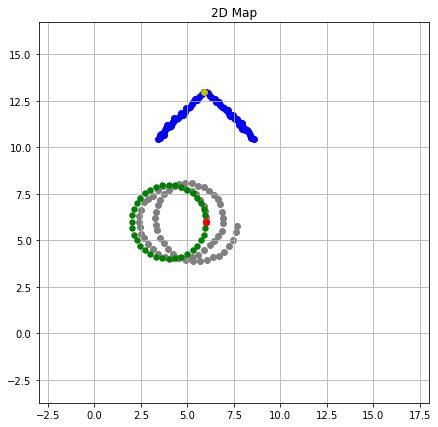

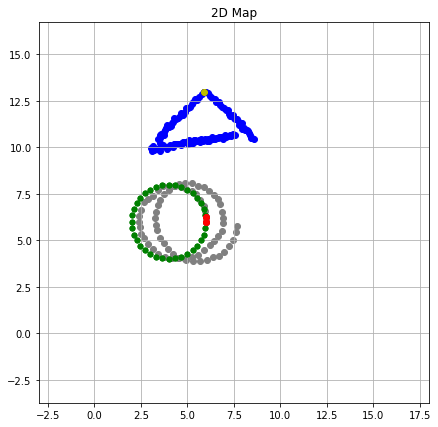

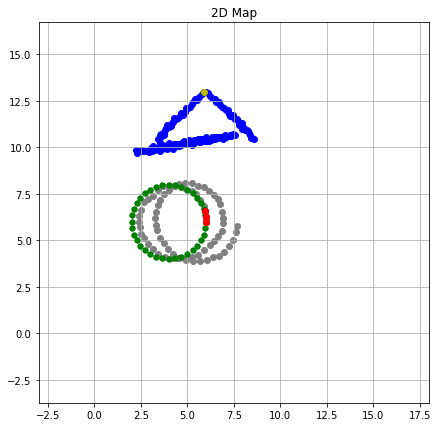

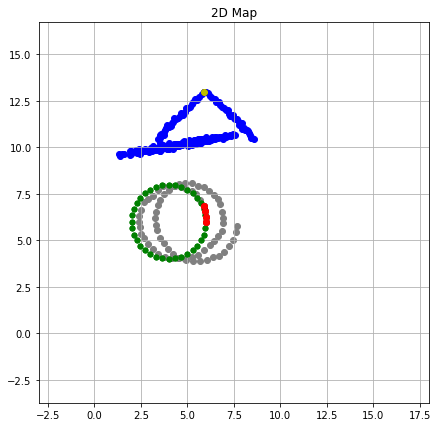

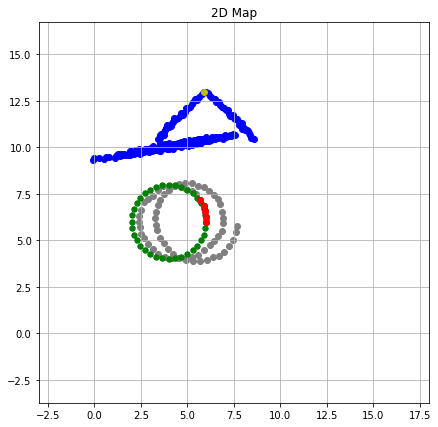

...

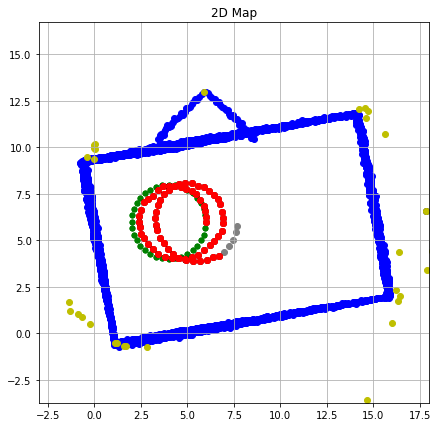

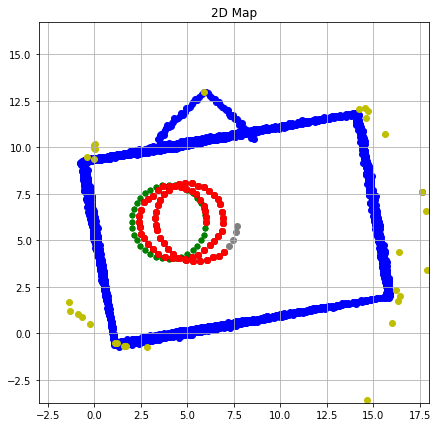

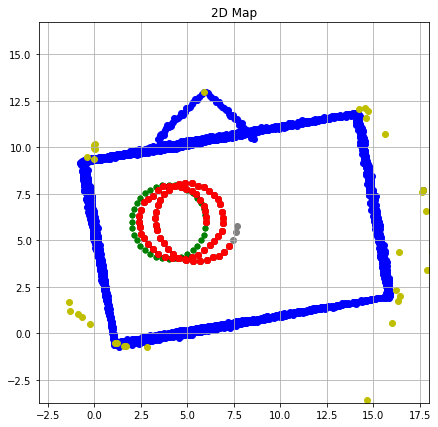

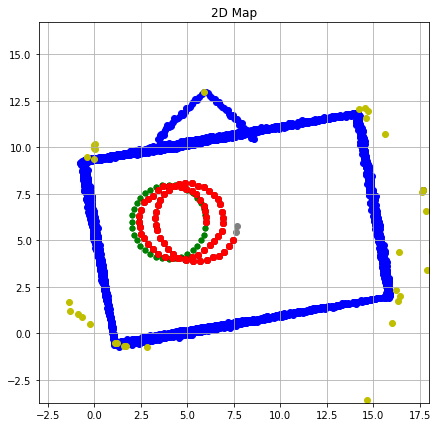

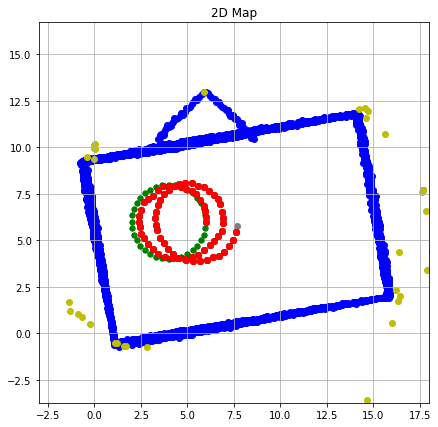

In [ ]:
#camera=Camera(fig) 

# Initial state
X=np.array(   [ [ px[0] ] ,
                [ py[0] ] ,
                [ th[0] ]  ] )

# Initial covariance
P = np.array( [ [ 0.0, 0.0, 0.0 ] ,
                [ 0.0, 0.0, 0.0 ] ,
                [ 0.0, 0.0, 0.0 ] ] )

# Meas matrix 
H = np.array( [ [ 1.0, 0.0, 0.0 ] ,
                [ 0.0, 1.0, 0.0 ] ] )       

# Meas noise
sigma_o = 5;
R = np.array( [ [ sigma_o**2, 0.0 ] ,
                [ 0.0, sigma_o**2 ] ] ) 

# Process noise
sigma_a = 4;
Q = np.array( [ [ sigma_a**2, 0.0, 0.0 ] ,
                [ 0.0, sigma_a**2, 0.0 ] ,
                [ 0.0, 0.0, sigma_a**2 ] ] ) 
# Meas
Z=np.array(   [ [ 0 ] ,
                [ 0 ]  ] )

U=np.array(   [ [ px[0] ] ,
                [ py[0] ] ,
                [ th[0] ]  ] )

# Kalman Filter loop:
 #Previous state
 #New Predicted state
 #Calculate Kalman Gain and Measured Data (Y)
 #Update Process and state Matrix


known_corners = []
num_features=0
robot_x, robot_y = [], []
x_corner, y_corner = [], []
border_x, border_y =[], []
all_x_corners, all_y_corners= [], []


for t in range(len(Lidar_range)):

  for i in range(len(angle)):

    border_x.append(px[t]+Lidar_range[t][i]*np.cos(th[t] + angle[i]/180*np.pi))
    border_y.append(py[t]+Lidar_range[t][i]*np.sin(th[t] +angle[i]/180*np.pi))

    possible_corner=detect_corner(Lidar_range[t])

    if (possible_corner != -1) and (corner_to_index(possible_corner[0]) == i):

      x_corner = X[0][0] + Lidar_range[t][i]*np.cos(X[2][0] + angle[i]/180*np.pi)
      y_corner = X[1][0] + Lidar_range[t][i]*np.sin(X[2][0] + angle[i]/180*np.pi)
      
      corner = np.array([[x_corner],[y_corner]])
      index_corner = check_known_corner(x_corner, y_corner, known_corners)


      if (index_corner==0):

          X=np.append(X,corner,axis=0)

          empty=np.zeros((2,1))
          U = np.append(U,empty,axis=0)

          tile_r=np.zeros((P.shape[0],2))
          tile_d=np.zeros((2,P.shape[0]+2))
          P = np.append(P,tile_r,axis=1)
          P = np.append(P,tile_d,axis=0)
          P[ P.shape[0]-2,P.shape[1]-2 ] = P[0][0]
          P[ P.shape[0]-1,P.shape[1]-1 ] = P[1][1]

          tile_r=np.zeros((Q.shape[0],2))
          tile_d=np.zeros((2,Q.shape[0]+2))
          Q = np.append(Q,tile_r,axis=1)
          Q = np.append(Q,tile_d,axis=0)
          Q[ Q.shape[0]-2,Q.shape[1]-2 ] = sigma_a**2
          Q[ Q.shape[0]-1,Q.shape[1]-1 ] = sigma_a**2

          known_corners.append([x_corner, y_corner])
          all_x_corners.append([x_corner])
          all_y_corners.append([y_corner])

          num_features = num_features + 1 

      else:
        feat = known_corners[index_corner-1]

        x_corner=feat[0]
        y_corner=feat[1]
          
        Z=np.array( [ [ Lidar_range[t][i] ] ,
                      [ np.deg2rad(i-30) ] ] )

        dist_corner =np.sqrt( (x_corner - X[0][0])**2 + (y_corner - X[1][0])**2 )
        ang_corner=np.arctan2( (y_corner - X[1][0]), (x_corner - X[0][0]) ) - X[2][0]  

        HX = np.array( [ [ dist_corner] , 
                         [ ang_corner ] ] )

        dr_dx = -(x_corner - X[0][0])/dist_corner
        dr_dy = -(y_corner - X[1][0])/dist_corner
        dr_theta = 0
        dfi_dx = (y_corner - X[1][0])/(dist_corner**2)
        dfi_dy = -(x_corner - X[0][0])/(dist_corner**2)
        dfi_theta = -1

        H = np.array( [ [ dr_dx, dr_dy, dr_theta ] , 
                        [ dfi_dx, dfi_dy, dfi_theta] ] )

        #values of the feature
        f11=  (x_corner - X [0][0]) / dist_corner
        f12=  (y_corner - X [1][0]) / dist_corner
        f21= -(y_corner - X[1][0]) / dist_corner
        f22=  (x_corner - X[0][0]) / dist_corner
                
        F= np.array([[f11,f12],  
                    [f21,f22]])
        
        empty=np.zeros((2,2))
        
        for i in range(num_features):
          if(i+1 != index_corner):
            H = np.append(H,empty,axis=1)
          else:
            H = np.append(H,F,axis=1)
            

        (X, P) = kf_update(X, P, Z, H, R, HX) 

    robot_x.append(X[0][0])
    robot_y.append(X[1][0])
    
  U[0][0]=x_delta[t]
  U[1][0]=y_delta[t]
  U[2][0]=th_delta[t]

  (X, P) = kf_predict(X, P, Q, U)


  fig, ax = plt.subplots(figsize=(7,7))
  ax.axis('equal')
  plt.xlim(-3,18)
  plt.ylim(-5,18)
  plt.plot(px, py, 'g.', ms=10)  #Real position of the robot
  plt.plot(robot_x, robot_y, 'r.', ms=10)  #position estimated of the robot using a Kalman Filter
  plt.scatter(border_x, border_y, color='b')
  plt.scatter(x_corner, y_corner, color='k')
  plt.scatter(all_x_corners, all_y_corners, color='y')
  plt.scatter(px_estimated, py_estimated, color='grey') #Estimated Position based only on deltas
  plt.grid()
  plt.title('2D Map')
  plt.show()

      


In [ ]:
#video = camera.animate(interval = 100, blit=False, repeat=False)

#HTML(video.to_html5_video())

---

.

.

.

.

<h1> Extras (Tentativas interessantes)

[[ 5.1260049  5.1334765  5.1276145 ...  5.2867043  5.1429835  5.1236028]
 [ 4.606962   4.6175944  4.4767256 ...  4.4675985  4.6891497  4.501786 ]
 [ 3.9281004  3.9475977  3.8681389 ...  4.6946241  4.8221473  4.7143348]
 ...
 [10.0969     9.9687153 10.317486  ...  5.5072914  5.3654677  5.4480188]
 [ 9.999143   9.6546878  9.3412661 ...  5.0121131  5.1567894  4.9275061]
 [ 7.219362   7.104592   7.0882174 ...  4.6231885  4.7531702  4.8312064]]
[ 2.97181433e-06 -7.49569307e-07 -4.18513572e-03  9.87632317e-04
  6.67855192e+00]


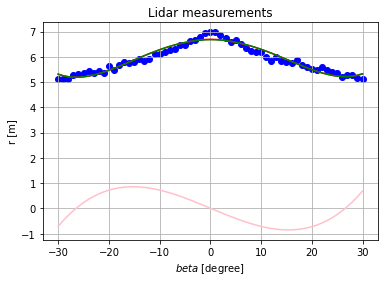

It's a Corner at 
at 30
[ 1.30129373e-07 -1.88117976e-06  5.45089929e-04  1.50840039e-03
  4.01944735e+00]


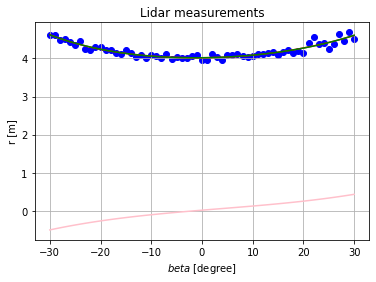

Not a corner :(
[8.50134976e-08 3.71716192e-06 6.67932086e-04 1.08387142e-02
 3.69001633e+00]


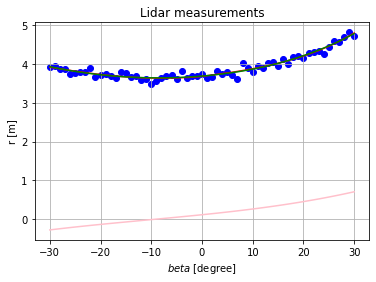

Not a corner :(
[-1.33572261e-07  1.02777608e-05  8.91121030e-04  2.19543541e-02
  3.49307255e+00]


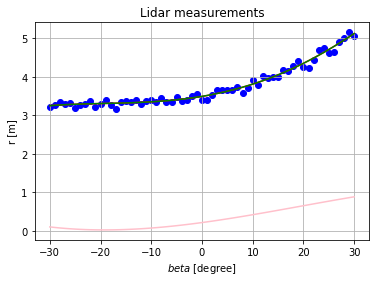

Not a corner :(
[3.97550430e-07 2.18474708e-05 7.71507812e-04 3.09650059e-02
 3.47070843e+00]


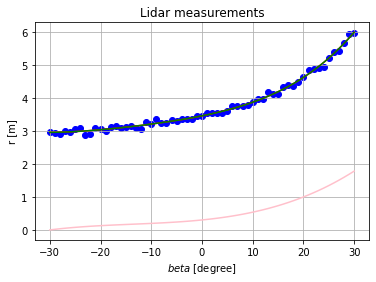

Not a corner :(
[-1.52933338e-06 -3.41696533e-06  2.38343942e-03  6.12724155e-02
  3.47607766e+00]


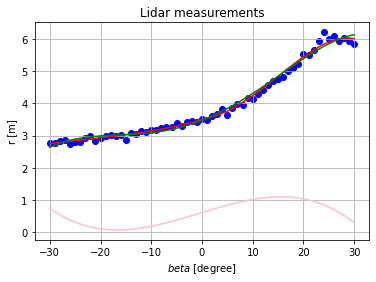

It's a Corner at 
at 54
[-2.30924350e-06 -5.67595883e-05  1.98566153e-03  9.36475067e-02
  3.86528404e+00]


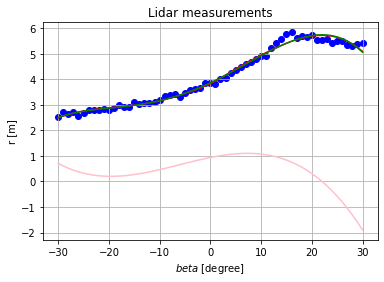

It's a Corner at 
at 46
[ 1.19666887e-06 -5.25589541e-05 -1.96792798e-03  8.10741862e-02
  4.60661477e+00]


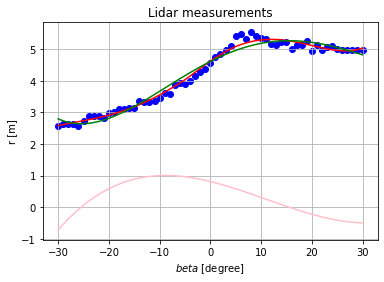

It's a Corner at 
at 38
[ 2.79087961e-06  3.04524240e-06 -3.72034304e-03  3.14561904e-02
  4.96871313e+00]


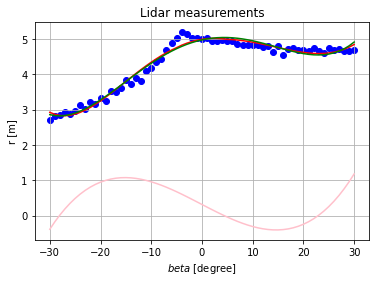

It's a Corner at 
at 26
[-7.91287063e-07  4.84051312e-05 -3.99303558e-05 -1.40809772e-02
  4.45741162e+00]


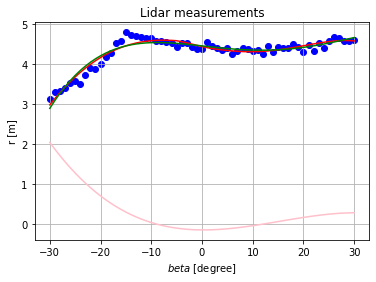

It's a Corner at 
at 15
[-5.15674744e-07  1.25913622e-05  9.28270814e-04 -3.48696736e-03
  3.99051378e+00]


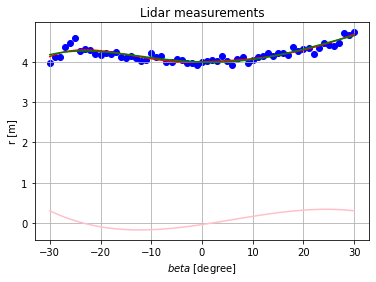

It's a Corner at 
at 60
[4.62922566e-08 4.98069097e-06 6.68148719e-04 9.90957703e-03
 3.68912793e+00]


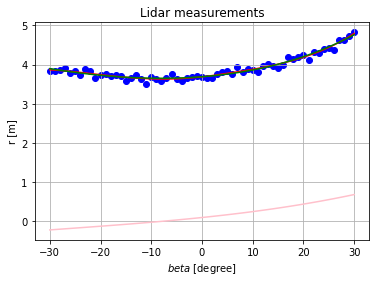

Not a corner :(
[2.01636667e-07 7.74437951e-06 7.00141520e-04 2.25621595e-02
 3.51336246e+00]


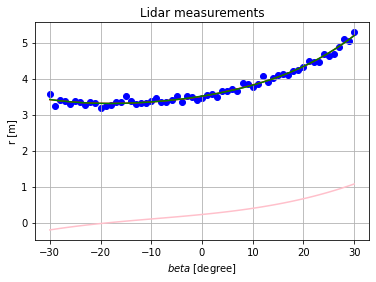

Not a corner :(
[4.17685291e-07 1.47820343e-05 8.20469157e-04 3.63017358e-02
 3.46045053e+00]


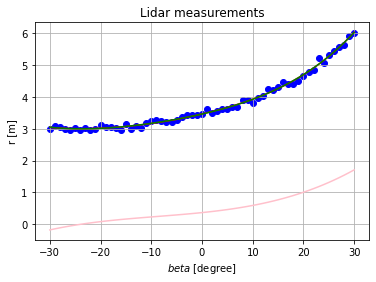

Not a corner :(
[1.29832249e-06 4.17482299e-05 8.49446129e-04 4.66982036e-02
 3.57247173e+00]


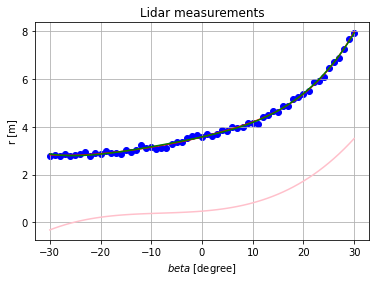

Not a corner :(
[-2.90023393e-06 -2.12005176e-05  4.01556487e-03  1.06099200e-01
  3.76773074e+00]


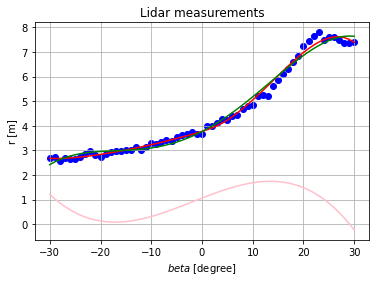

It's a Corner at 
at 53
[-2.87356778e-06 -9.52291588e-05  2.47952529e-03  1.49381526e-01
  4.64046318e+00]


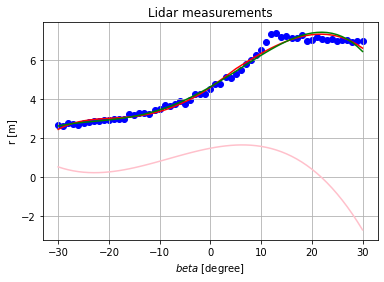

It's a Corner at 
at 43
[ 3.11694403e-06 -6.82597769e-05 -4.06920496e-03  1.20579901e-01
  6.06401860e+00]


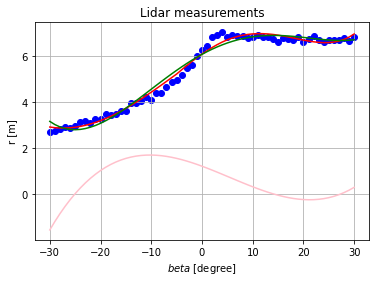

It's a Corner at 
at 34
[ 2.90665045e-06  3.06191837e-05 -4.24244333e-03  3.88998481e-02
  6.50426112e+00]


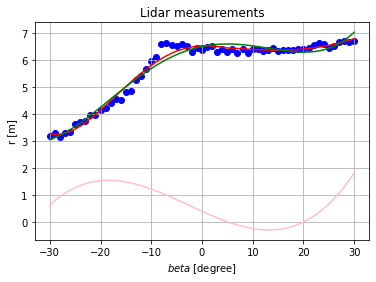

It's a Corner at 
at 60
[-2.37501842e-06  6.84747972e-05  1.28661390e-03 -9.80171387e-03
  5.97839273e+00]


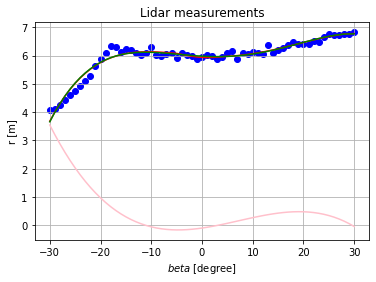

It's a Corner at 
at 60
[-1.39620319e-07  4.79429641e-06  1.18097323e-03  1.86718791e-02
  5.70172976e+00]


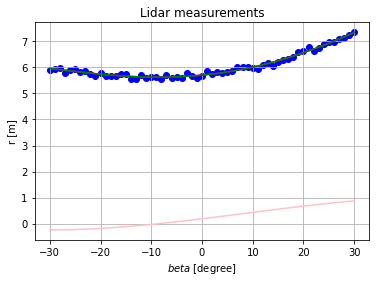

Not a corner :(
[1.63880513e-07 1.36695349e-05 1.15713963e-03 3.59742329e-02
 5.64814039e+00]


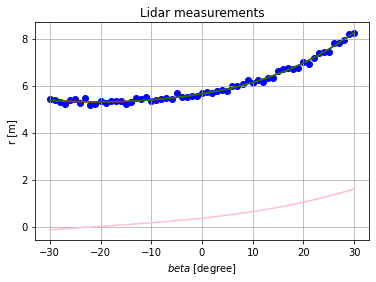

Not a corner :(
[6.11577769e-07 2.96979312e-05 1.36474380e-03 5.59742148e-02
 5.77345610e+00]


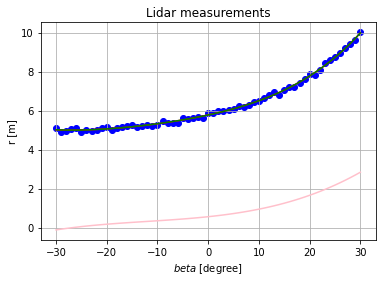

Not a corner :(
[1.10645409e-06 6.53930272e-05 2.39314221e-03 8.61119700e-02
 6.12991012e+00]


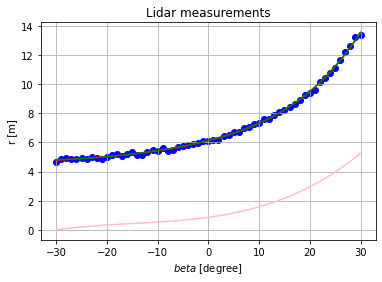

Not a corner :(
[-5.49436104e-06 -6.07753032e-05  6.73959026e-03  1.92307524e-01
  6.87302555e+00]


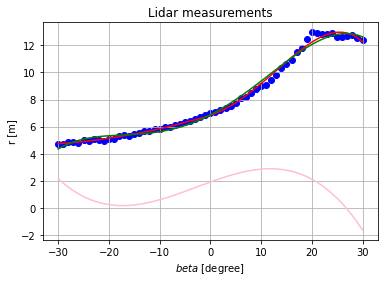

It's a Corner at 
at 50
[-3.02873094e-06 -1.61283949e-04  1.96408605e-03  2.46284214e-01
  8.80154591e+00]


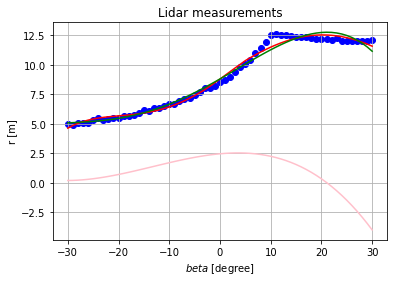

It's a Corner at 
at 41
[ 7.29567467e-06 -7.90877688e-05 -9.01265578e-03  1.71436170e-01
  1.12742036e+01]


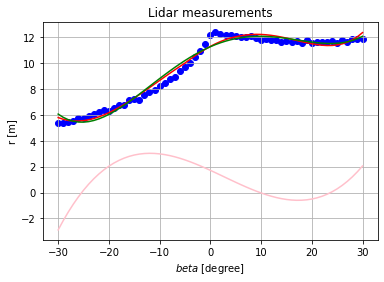

It's a Corner at 
at 31
[ 3.21064957e-06  8.91107688e-05 -5.71706194e-03  3.26881499e-02
  1.16852348e+01]


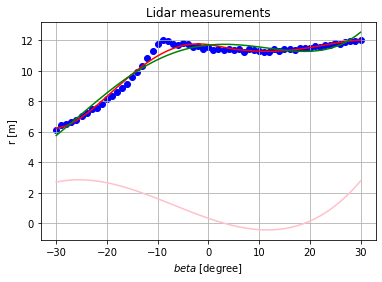

It's a Corner at 
at 60
[-4.59917091e-06  1.12551684e-04  2.95663040e-03 -2.43566334e-02
  1.09691005e+01]


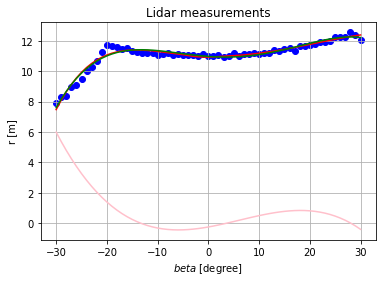

It's a Corner at 
at 58
[-3.96159910e-06 -1.00598459e-04  2.68258260e-03  5.56497572e-02
  1.07916598e+01]


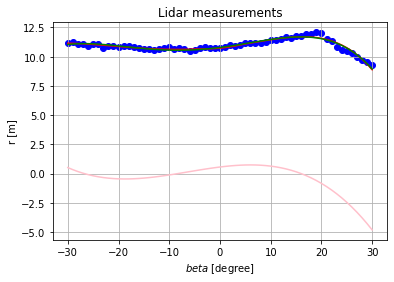

It's a Corner at 
at 49
[ 1.99097825e-06 -8.84084711e-05 -4.15272821e-03  2.04741531e-02
  1.11564846e+01]


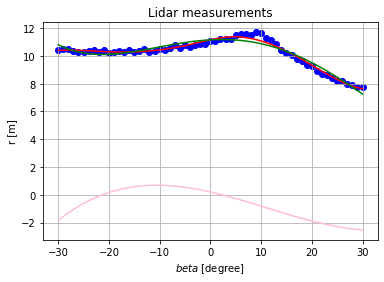

It's a Corner at 
at 39
[ 5.81389509e-06  3.16933149e-05 -7.53982667e-03 -8.26864983e-02
  1.07588780e+01]


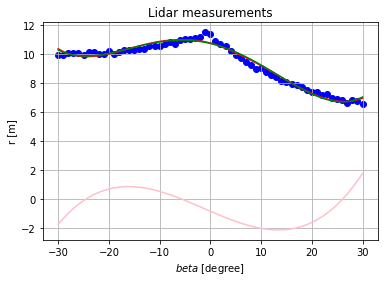

It's a Corner at 
at 29
[-1.08285396e-06  1.14407719e-04 -2.89821180e-04 -1.57063711e-01
  8.78062551e+00]


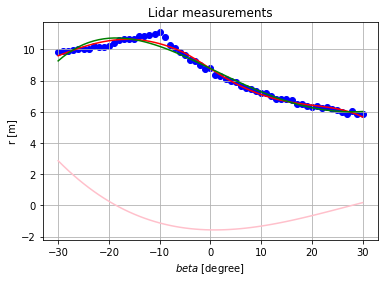

It's a Corner at 
at 20
[-3.62338139e-06  5.06868422e-05  4.13580899e-03 -1.30193792e-01
  6.84776133e+00]


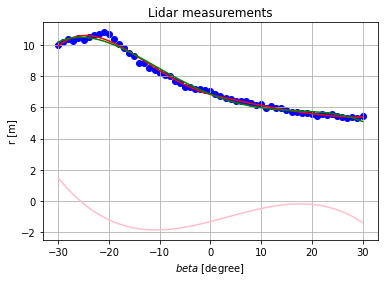

It's a Corner at 
at 9
[ 5.36508346e-07 -2.98098024e-05  1.39709345e-03 -5.57034602e-02
  5.78008649e+00]


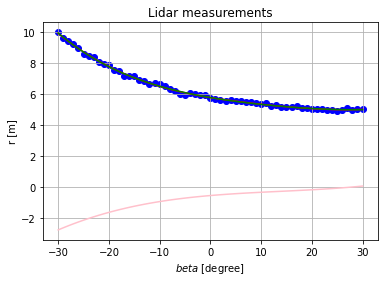

Not a corner :(
[-4.05831342e-08 -1.22544374e-05  1.14121945e-03 -3.14472381e-02
  4.95834499e+00]


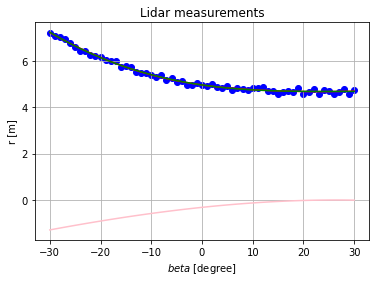

Not a corner :(
[ 1.34713587e-07 -9.43613438e-06  7.28971903e-04 -1.15277904e-02
  4.40935153e+00]


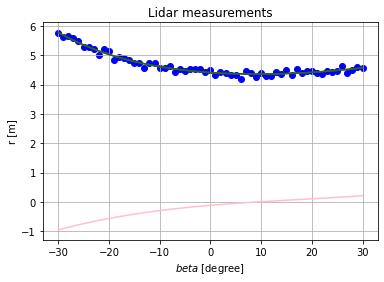

Not a corner :(
[ 7.27836061e-08  2.03270642e-06  6.52709385e-04 -8.98268168e-04
  3.97984325e+00]


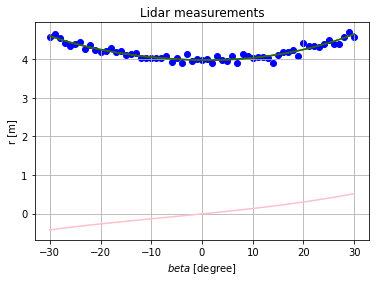

Not a corner :(
[-2.24844386e-07  4.40324371e-06  8.56752263e-04  1.09812125e-02
  3.67931083e+00]


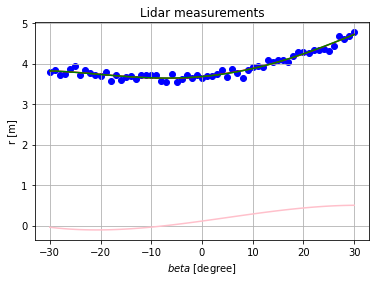

Not a corner :(
[-1.12392606e-07  8.64558938e-06  8.72941532e-04  2.25731036e-02
  3.50630393e+00]


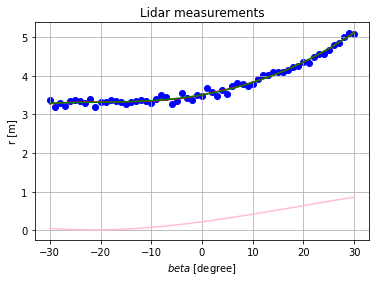

Not a corner :(
[4.67005724e-07 1.19053025e-05 7.50091582e-04 3.58516120e-02
 3.46658982e+00]


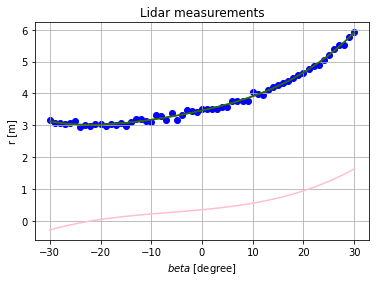

Not a corner :(
[-1.35956602e-06 -6.39111318e-06  2.27886455e-03  6.43174731e-02
  3.49432956e+00]


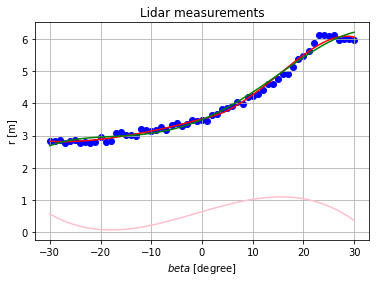

It's a Corner at 
at 54
[-2.15562859e-06 -6.07923627e-05  1.92875132e-03  9.72261376e-02
  3.85983873e+00]


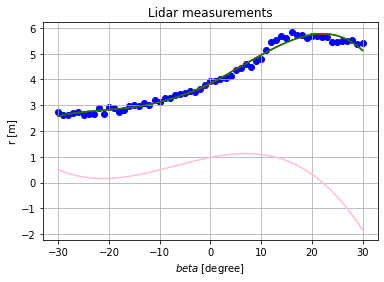

It's a Corner at 
at 46
[ 1.29412658e-06 -5.16111502e-05 -2.01947793e-03  8.05449604e-02
  4.61314516e+00]


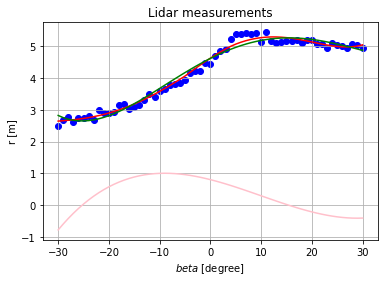

It's a Corner at 
at 41
[ 2.72455230e-06  9.02423891e-06 -3.58902018e-03  2.75920615e-02
  4.93400541e+00]


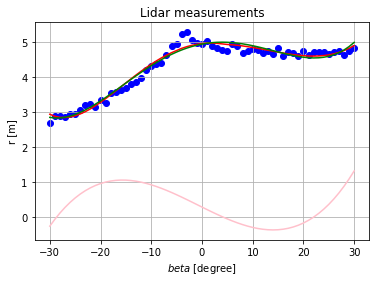

It's a Corner at 
at 27
[-5.78751730e-07  4.38557678e-05 -2.82306387e-04 -1.06290124e-02
  4.49178777e+00]


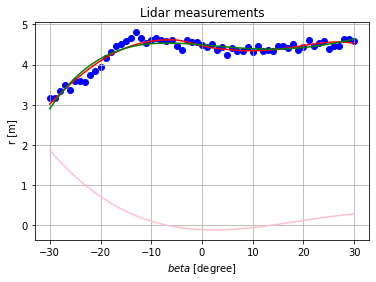

It's a Corner at 
at 17
[-5.64707984e-07  1.17862661e-05  9.32488698e-04 -4.35484990e-03
  3.99626647e+00]


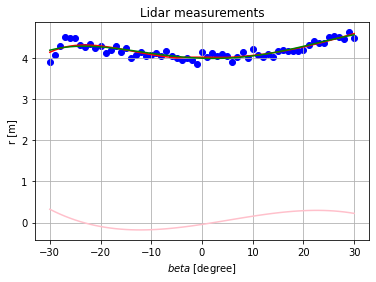

It's a Corner at 
at 59
[6.01894153e-08 9.30209211e-06 6.59002445e-04 8.00288032e-03
 3.68393796e+00]


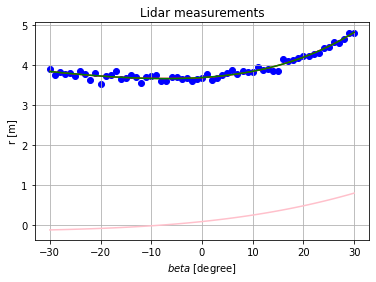

Not a corner :(
[-4.90920991e-08  1.14481195e-05  8.14590977e-04  2.03539544e-02
  3.51130251e+00]


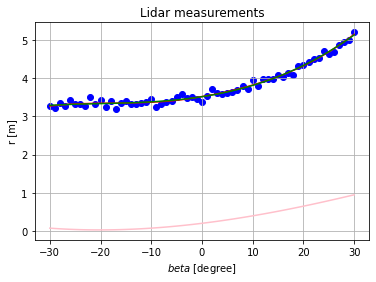

Not a corner :(
[7.10312911e-07 2.08645226e-05 5.29821821e-04 3.18842474e-02
 3.50280884e+00]


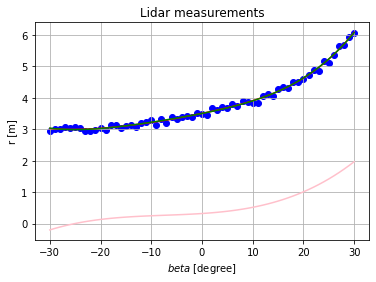

Not a corner :(
[8.75463468e-07 4.42223569e-05 1.15213149e-03 4.51112473e-02
 3.55765538e+00]


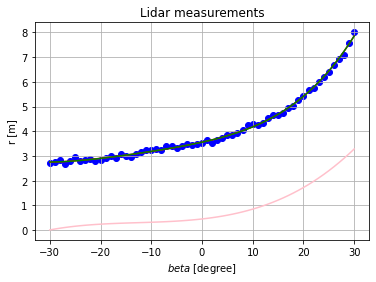

Not a corner :(
[-2.88202709e-06 -2.27341178e-05  3.95785208e-03  1.07760742e-01
  3.77916949e+00]


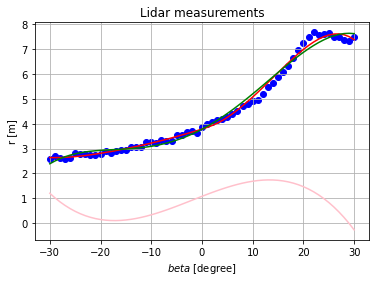

It's a Corner at 
at 52
[-2.93108430e-06 -9.31582433e-05  2.53223474e-03  1.48440333e-01
  4.64358788e+00]


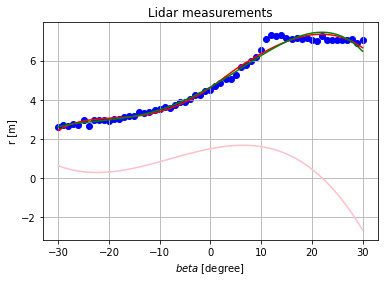

It's a Corner at 
at 42
[ 3.22516102e-06 -7.05329140e-05 -4.14134683e-03  1.21419099e-01
  6.07196672e+00]


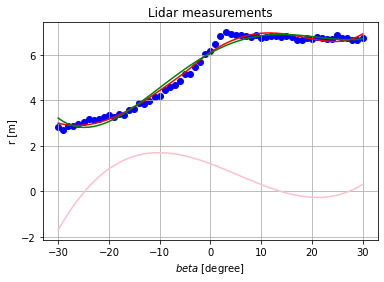

It's a Corner at 
at 33
[ 3.16146741e-06  2.71152676e-05 -4.50463661e-03  4.00467521e-02
  6.53990187e+00]


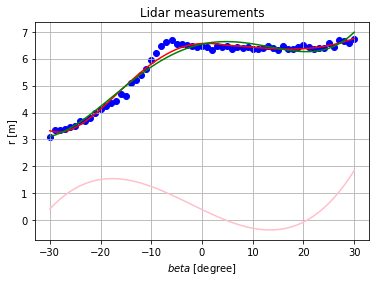

It's a Corner at 
at 60
[-2.08131923e-06  7.22449692e-05  1.07843703e-03 -1.24620397e-02
  5.99491065e+00]


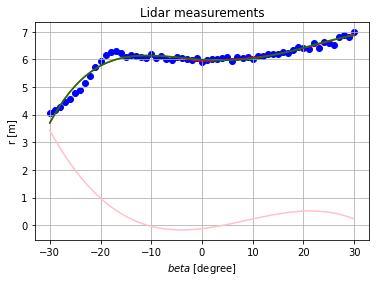

It's a Corner at 
at 60
[-3.44051711e-08  7.89273140e-06  1.06281278e-03  1.77395556e-02
  5.74237582e+00]


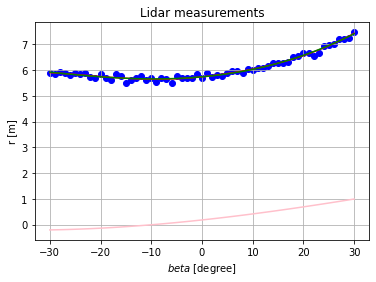

Not a corner :(
[2.83018131e-07 1.32124526e-05 1.10635207e-03 3.55764364e-02
 5.65391374e+00]


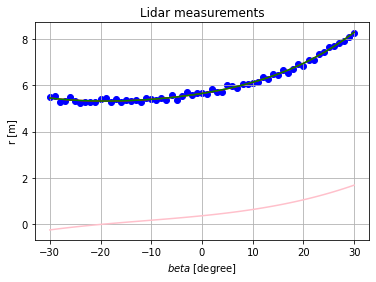

Not a corner :(
[5.51500218e-07 2.67981066e-05 1.42632633e-03 5.72228663e-02
 5.75944751e+00]


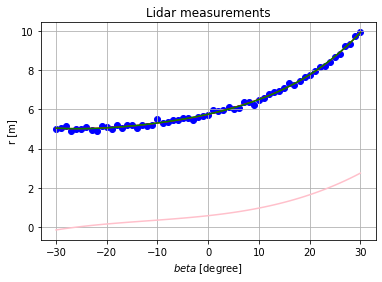

Not a corner :(
[1.24464872e-06 6.52991019e-05 2.25427566e-03 8.50735222e-02
 6.13163589e+00]


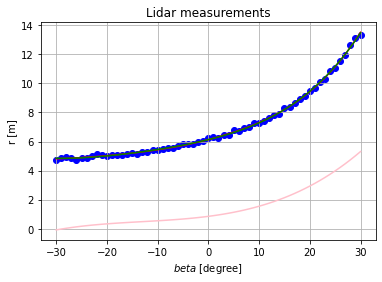

Not a corner :(
[-5.67170152e-06 -5.92336181e-05  6.94800178e-03  1.90922930e-01
  6.85448253e+00]


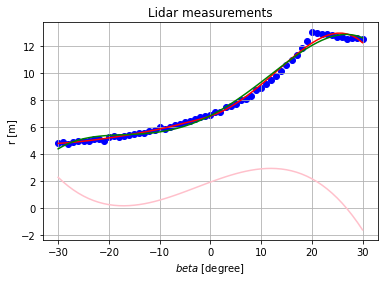

It's a Corner at 
at 50
[-3.25477153e-06 -1.63343272e-04  2.13522529e-03  2.48197451e-01
  8.79512671e+00]


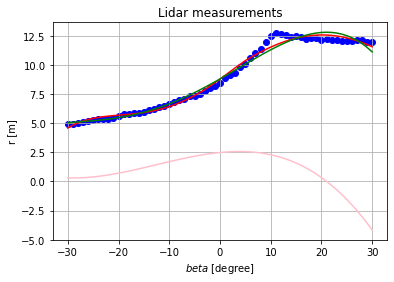

It's a Corner at 
at 41
[ 7.24878716e-06 -8.01695559e-05 -8.91655937e-03  1.71253049e-01
  1.12756362e+01]


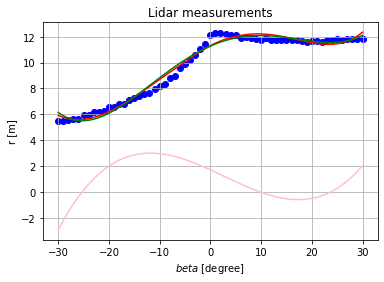

It's a Corner at 
at 31
[ 3.51138436e-06  8.67719313e-05 -6.00597021e-03  3.42637069e-02
  1.17393379e+01]


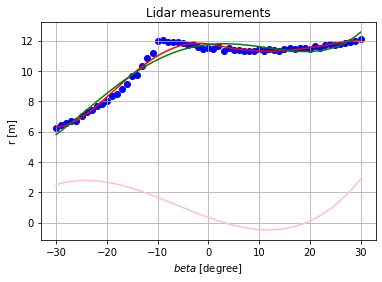

It's a Corner at 
at 60
[-4.83351258e-06  1.10367559e-04  3.11155856e-03 -2.34240214e-02
  1.09573541e+01]


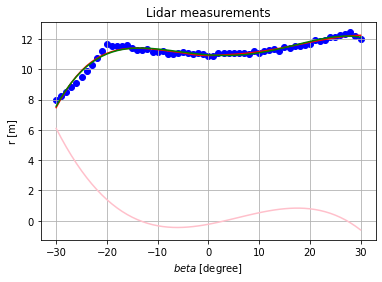

It's a Corner at 
at 58
[-3.59086943e-06 -1.02474411e-04  2.42865899e-03  5.67143851e-02
  1.08031158e+01]


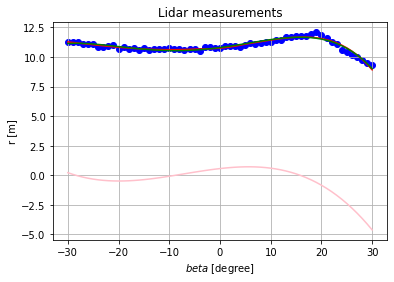

It's a Corner at 
at 49
[ 1.94643767e-06 -8.99249700e-05 -4.06535474e-03  2.17033724e-02
  1.11507873e+01]


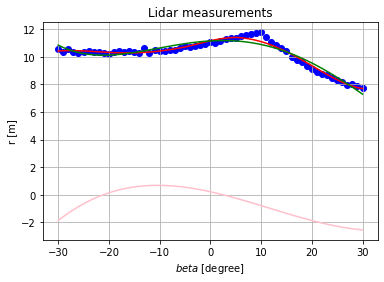

It's a Corner at 
at 40
[ 5.98883651e-06  3.31658967e-05 -7.70845140e-03 -8.34739438e-02
  1.07964174e+01]


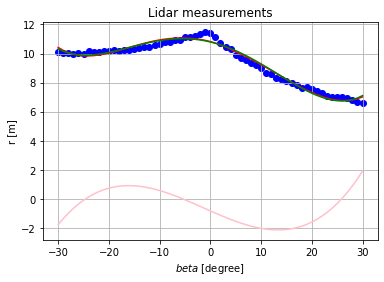

It's a Corner at 
at 29
[-1.15221864e-06  1.14947844e-04 -2.11638458e-04 -1.57202111e-01
  8.78283401e+00]


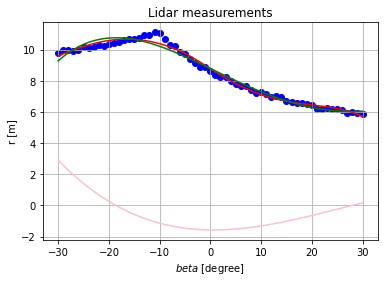

It's a Corner at 
at 19
[-3.51912631e-06  5.27908654e-05  4.06682354e-03 -1.30909208e-01
  6.86279631e+00]


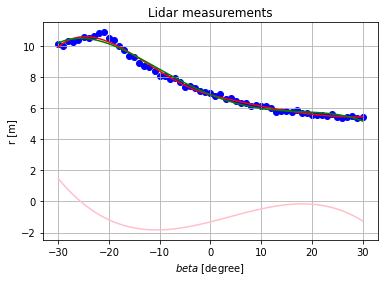

It's a Corner at 
at 9
[ 4.63866563e-07 -2.76917276e-05  1.45269710e-03 -5.75449440e-02
  5.77926193e+00]


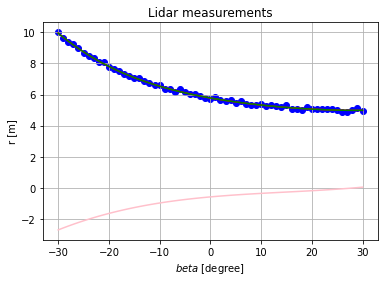

Not a corner :(
[-3.89794546e-09 -1.00100327e-05  1.16917071e-03 -3.19744835e-02
  4.94295762e+00]


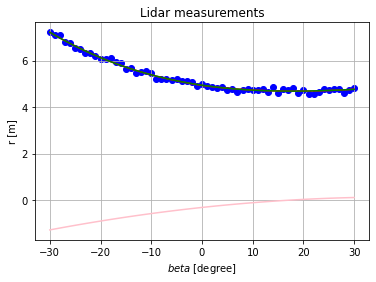

Not a corner :(


In [ ]:
from scipy.signal import savgol_filter
from statistics import mean
Lidar_range = data.iloc[:, np.arange(6,67,1)].values
print(Lidar_range)
px = data[0].values
py = data[1].values



t=1*10 #1sec times number of samples/second

angle = np.linspace(-30, 30, 61)

for i in range(len(Lidar_range)):
  plt.figure()
  plt.scatter(angle, Lidar_range[i], color='b')
  plt.title('Lidar measurements')
  plt.ylabel('r [m]')
  plt.xlabel('$beta$ [degree]')
  plt.grid();
  yhat = savgol_filter(Lidar_range[i], 51, 10)
  yhat2 = savgol_filter(yhat, 51, 4)
  plt.plot(angle,yhat2, color='red')
  locals_maximum=argrelextrema(yhat2, np.greater)
# em desenvolvimento


  coefs5deg = np.polyfit(angle,yhat2,4)
  values5deg = np.polyval(coefs5deg,angle)
  plt.plot(angle,values5deg,color='green')
  print(coefs5deg)

  coefsder = np.polyder(coefs5deg,1)
  valuesder = np.polyval(coefsder,angle) * 10
  plt.plot(angle,valuesder,color='pink')
  #plt.show()
  
 
  max_dist = max(Lidar_range[i])
  max_index = Lidar_range[i].tolist().index(max_dist)
  corner_candidate = [max_index,max_dist]

  first_point = [0,mean([Lidar_range[i][0],Lidar_range[i][1]])]
  last_point = [60,mean([Lidar_range[i][60],Lidar_range[i][59]])]
  first_wall = np.polyfit(first_point, corner_candidate, 1) # y = mx+b    m is stored on [0], b is stored on [1]
  last_wall = np.polyfit(last_point, corner_candidate, 1)
  

  plt.show()
#
  if(len(locals_maximum[0])>=1):
    print("It's a Corner at ")
    print('at',max_index)

  else:
    print("Not a corner :(")  
    

[[ 5.1260049  5.1334765  5.1276145 ...  5.2867043  5.1429835  5.1236028]
 [ 4.606962   4.6175944  4.4767256 ...  4.4675985  4.6891497  4.501786 ]
 [ 3.9281004  3.9475977  3.8681389 ...  4.6946241  4.8221473  4.7143348]
 ...
 [10.0969     9.9687153 10.317486  ...  5.5072914  5.3654677  5.4480188]
 [ 9.999143   9.6546878  9.3412661 ...  5.0121131  5.1567894  4.9275061]
 [ 7.219362   7.104592   7.0882174 ...  4.6231885  4.7531702  4.8312064]]


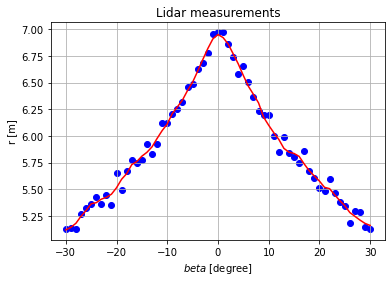

Possible a corner


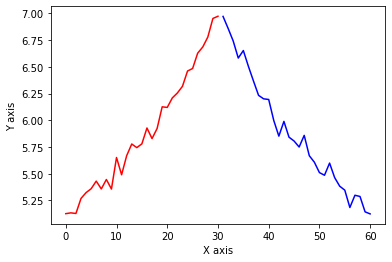

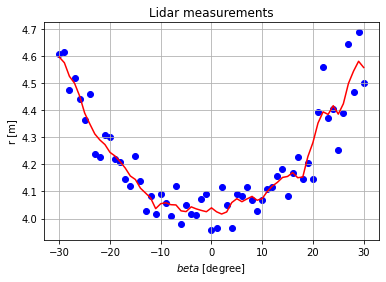

Possible a corner


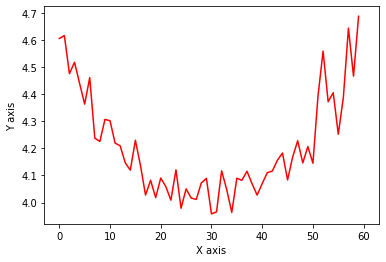

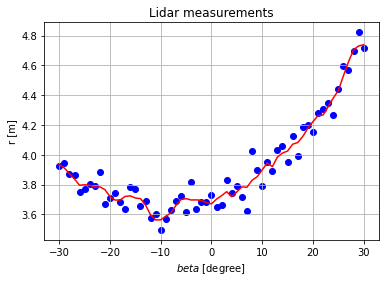

Possible a corner


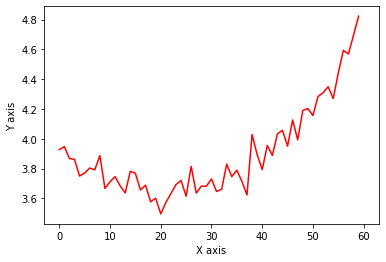

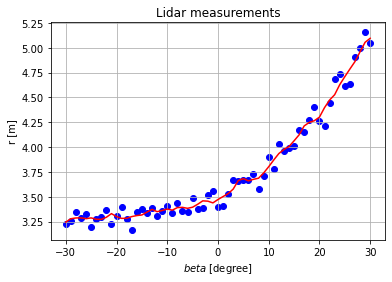

Possible a corner


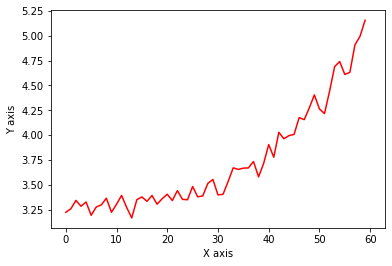

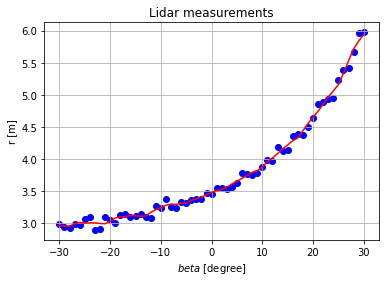

Not a corner


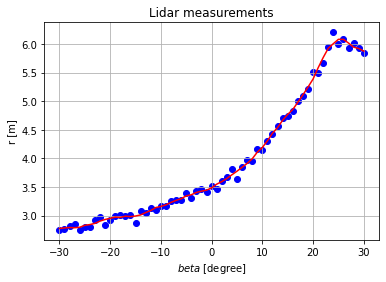

Possible a corner


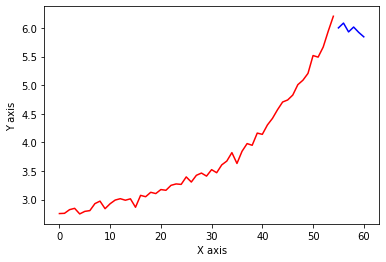

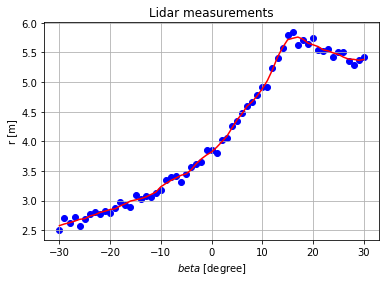

Possible a corner


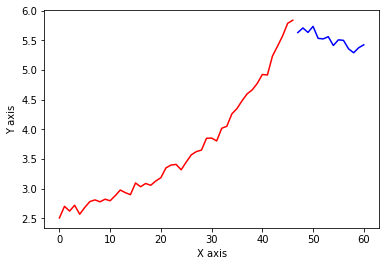

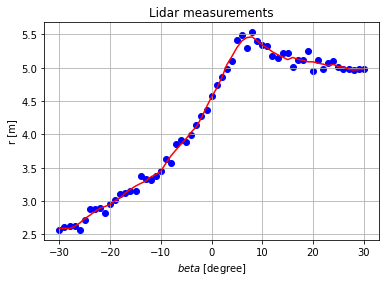

Possible a corner


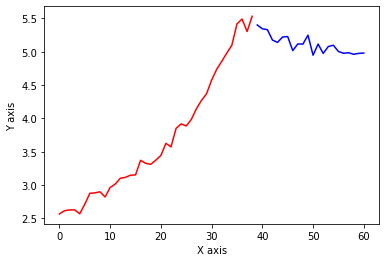

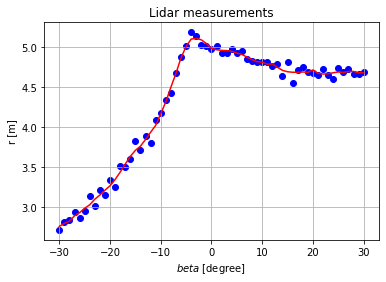

Possible a corner


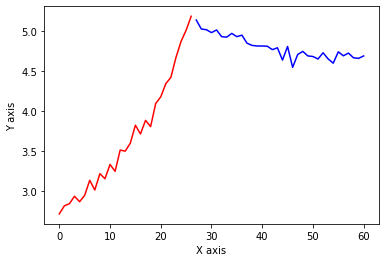

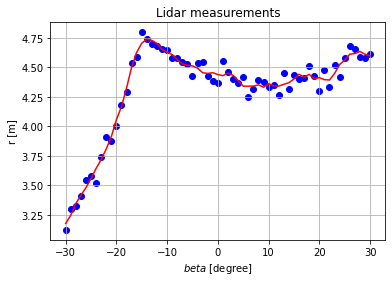

Possible a corner


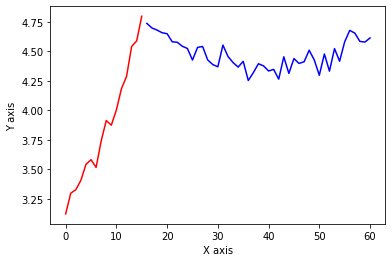

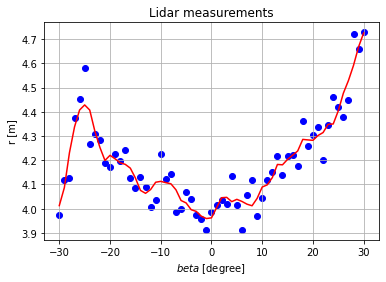

Not a corner


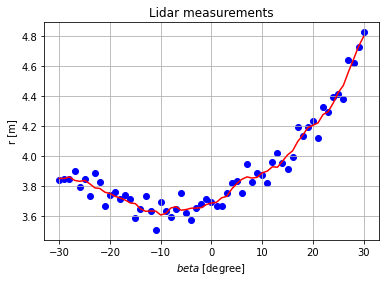

Not a corner


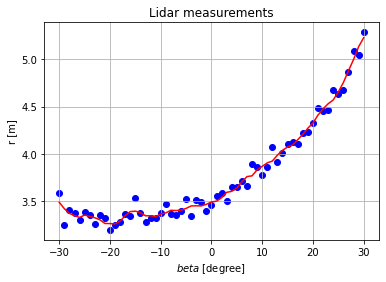

Not a corner


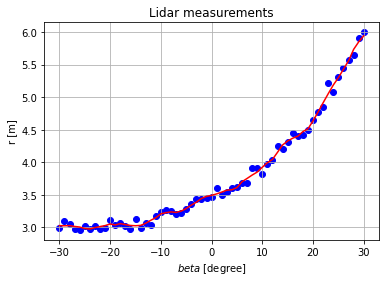

Not a corner


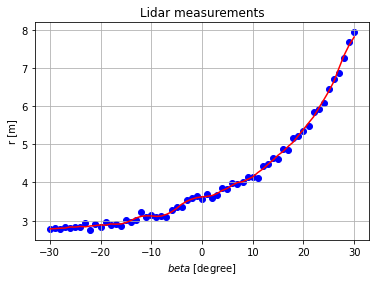

Not a corner


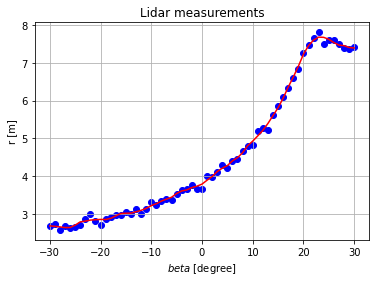

Possible a corner


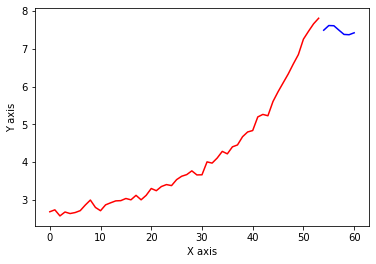

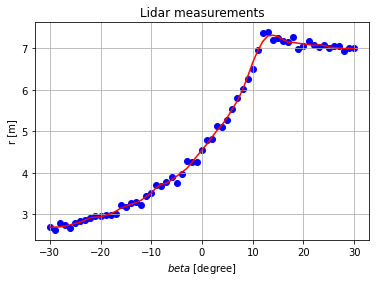

Possible a corner


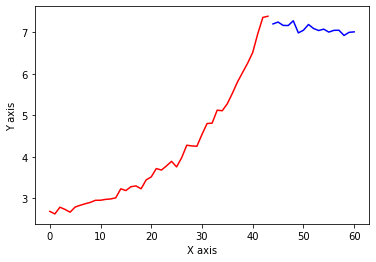

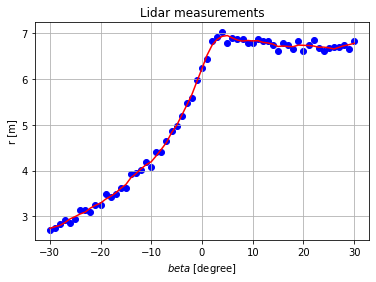

Possible a corner


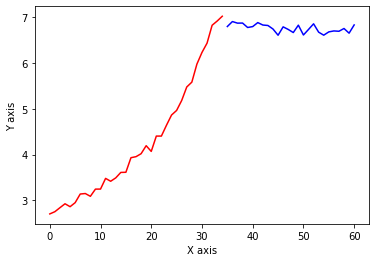

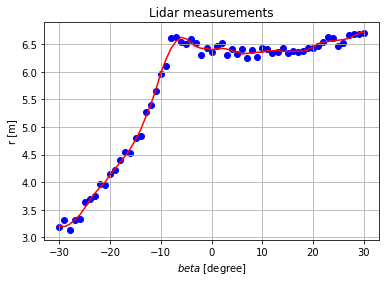

Not a corner


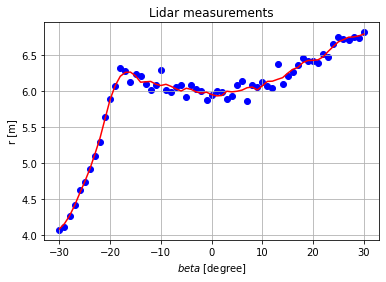

Not a corner


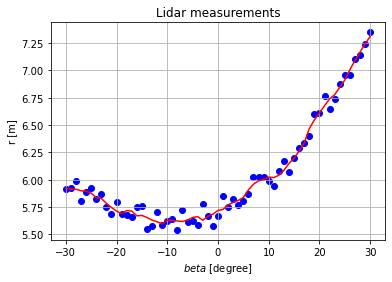

Not a corner


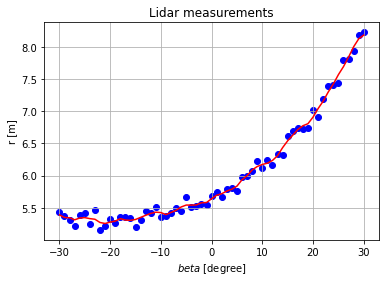

Not a corner


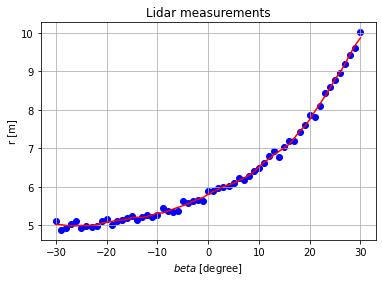

Not a corner


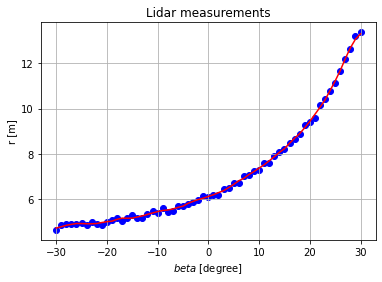

Not a corner


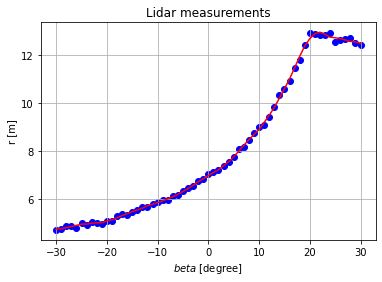

Possible a corner


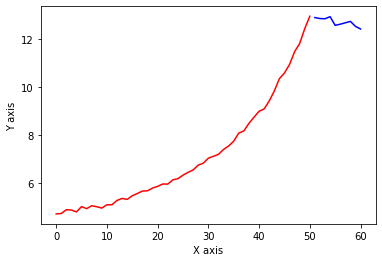

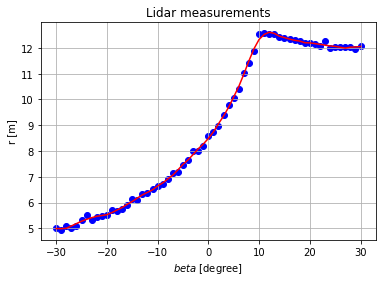

Possible a corner


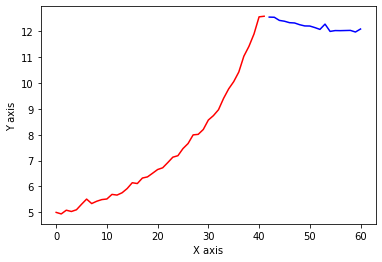

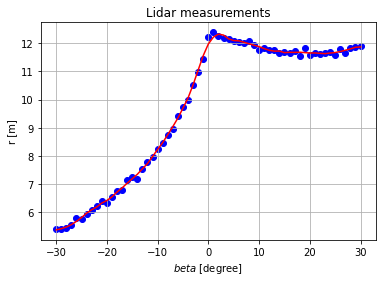

Possible a corner


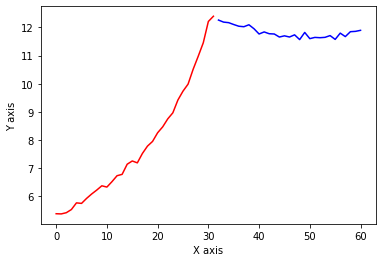

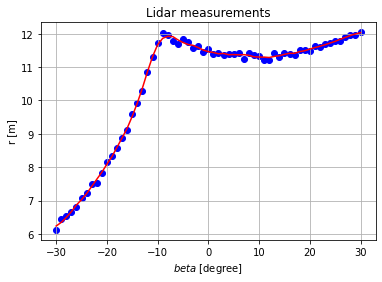

Not a corner


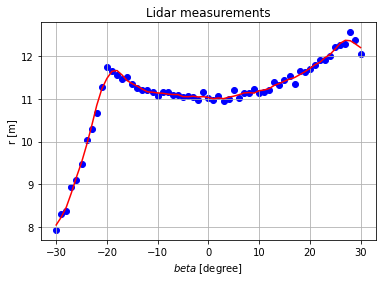

Possible a corner


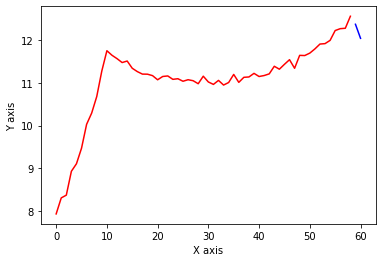

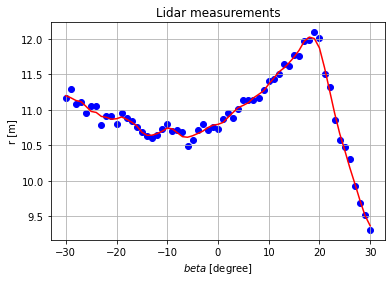

Possible a corner


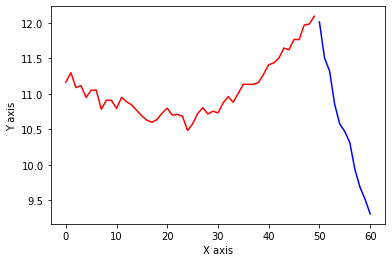

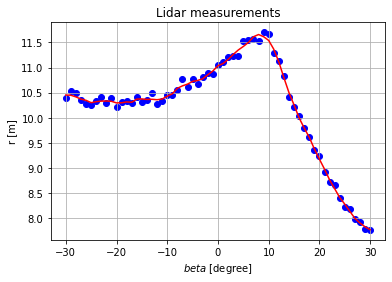

Possible a corner


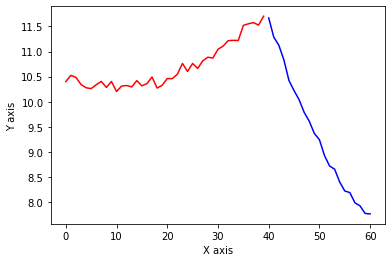

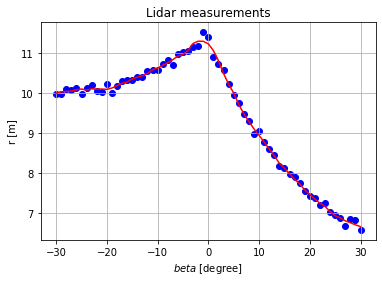

Possible a corner


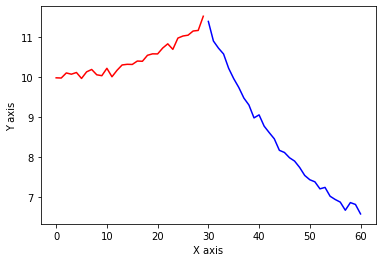

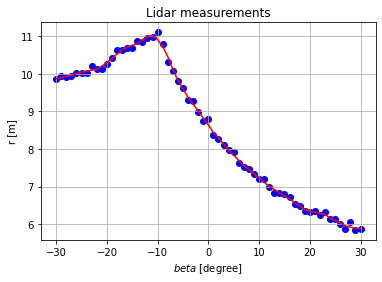

Possible a corner


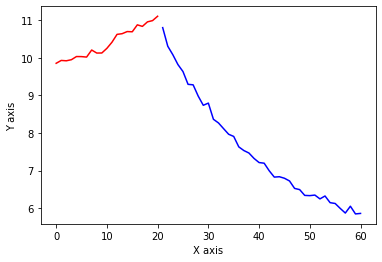

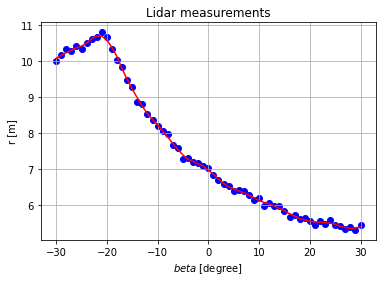

Possible a corner


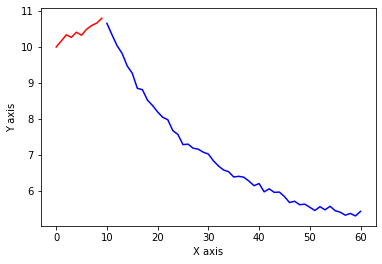

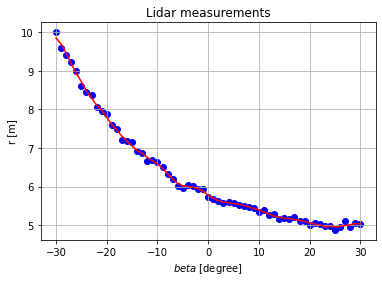

Not a corner


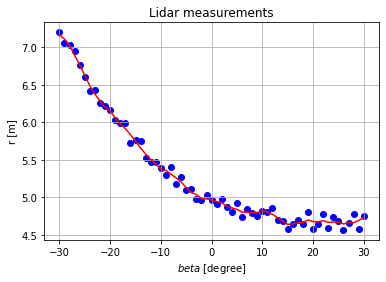

Not a corner


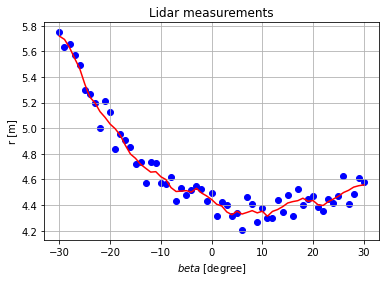

Not a corner


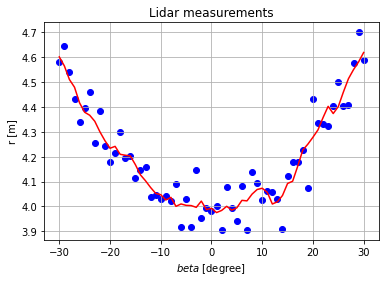

Possible a corner


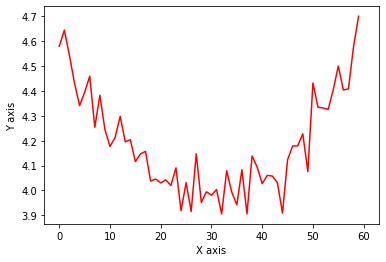

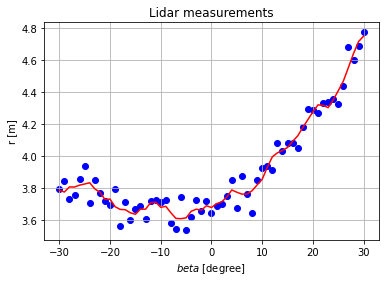

Not a corner


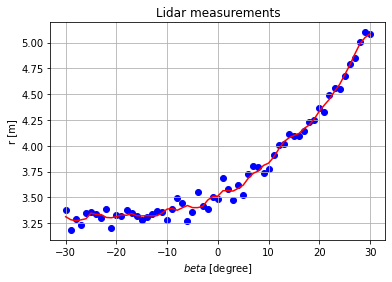

Possible a corner


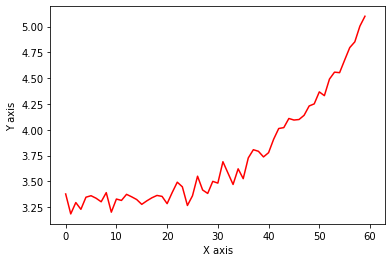

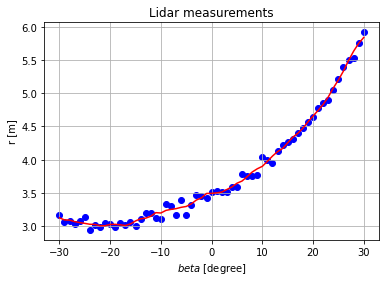

Not a corner


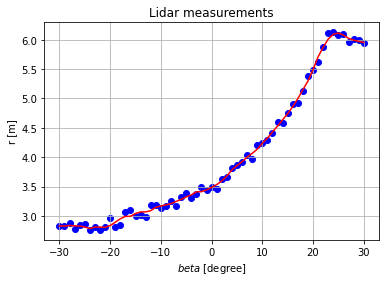

Possible a corner


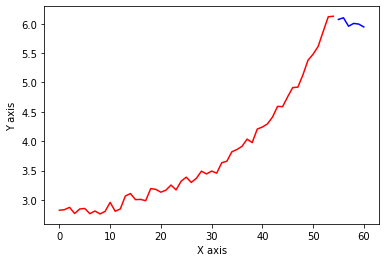

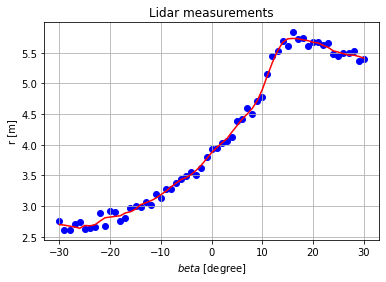

Possible a corner


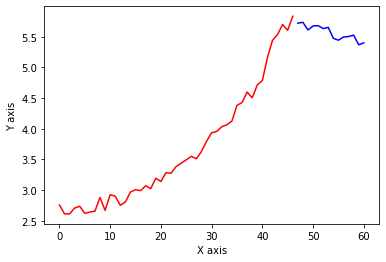

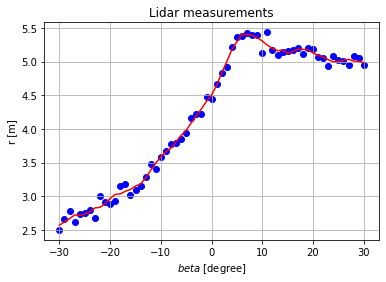

Possible a corner


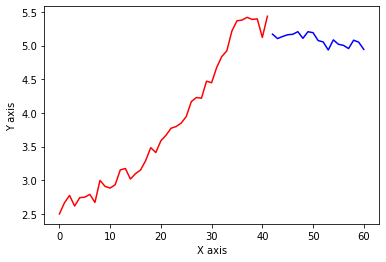

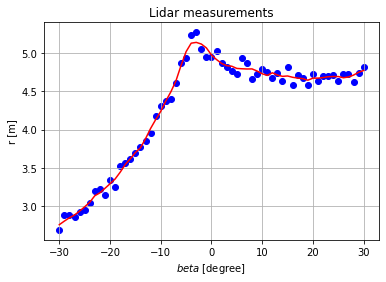

Possible a corner


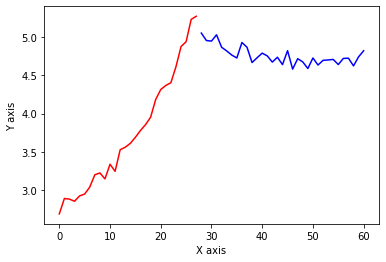

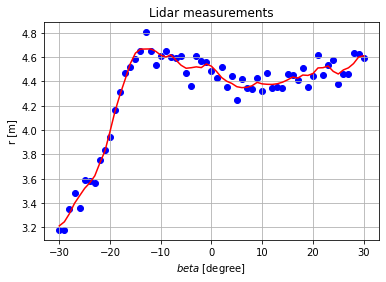

Possible a corner


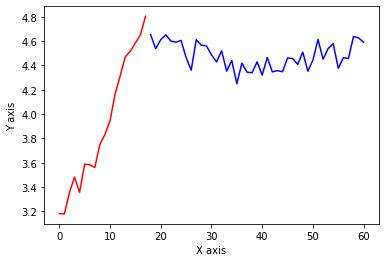

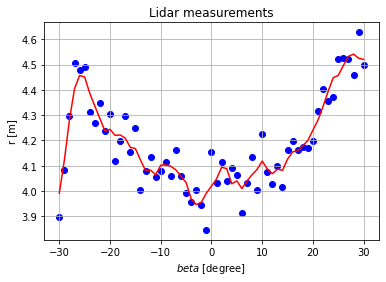

Possible a corner


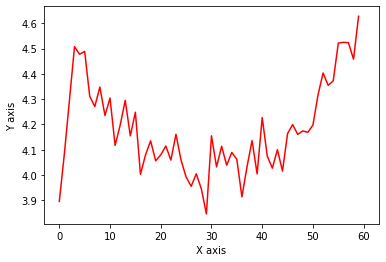

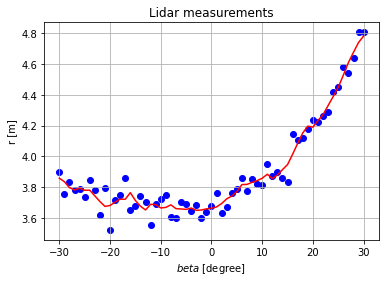

Not a corner


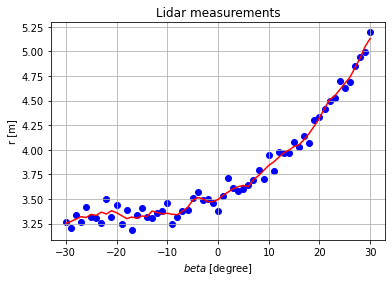

Not a corner


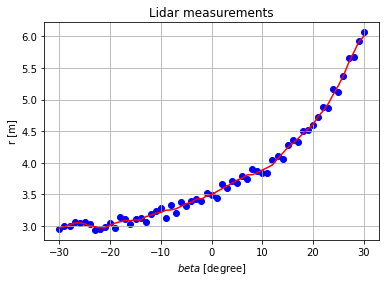

Not a corner


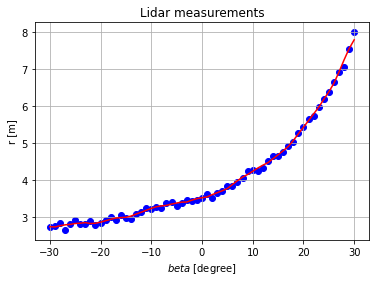

Not a corner


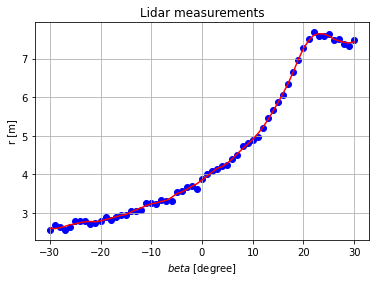

Possible a corner


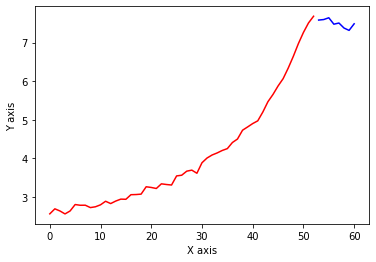

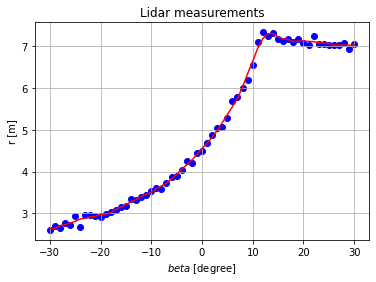

Possible a corner


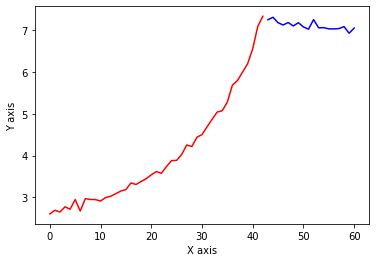

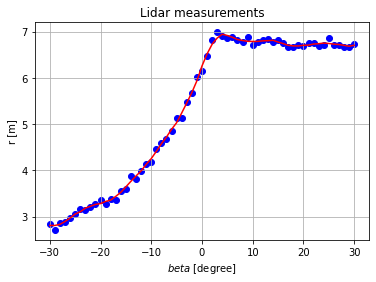

Possible a corner


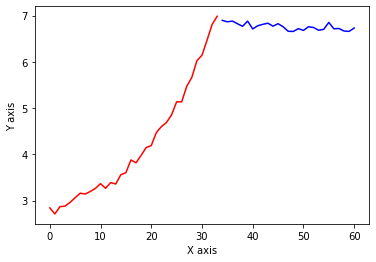

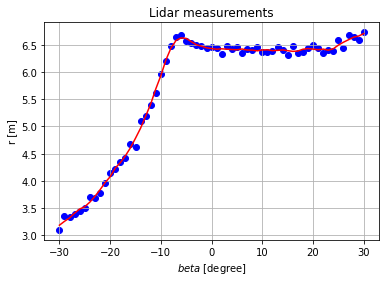

Not a corner


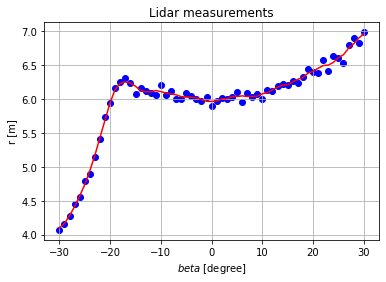

Not a corner


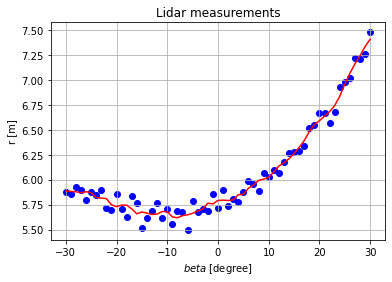

Not a corner


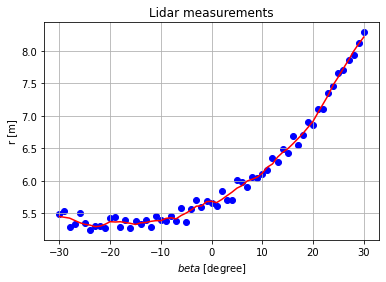

Not a corner


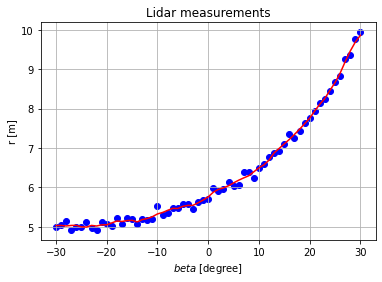

Not a corner


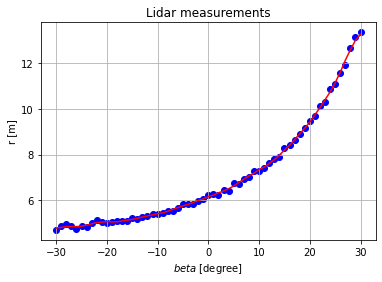

Not a corner


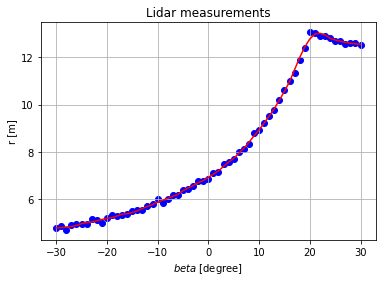

Possible a corner


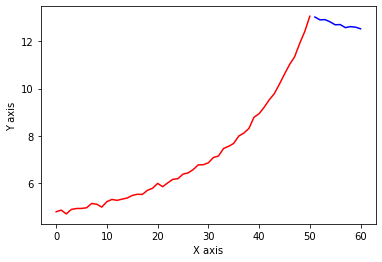

In [ ]:
Lidar_range = data.iloc[:, np.arange(6,67,1)].values
print(Lidar_range)
px = data[0].values
py = data[1].values
th = data[2].values
t=1*10 #1sec times number of samples/second

angle = np.linspace(-30, 30, 61)

for i in range(len(Lidar_range[t])):
  Lidar_range_smooth = signal.savgol_filter(Lidar_range[i], window_length=9, polyorder=3, mode="nearest")
  plt.figure()
  plt.scatter(angle, Lidar_range[i], color='b')
  plt.title('Lidar measurements')
  plt.ylabel('r [m]')
  plt.xlabel('$beta$ [degree]')
  plt.plot(angle, Lidar_range_smooth, color ="red")
  plt.grid();
  plt.show()
  if((max(Lidar_range[i]) == Lidar_range[i][0]) or (max(Lidar_range[i]) == Lidar_range[i][60])):
    print("Not a corner")
  else:
    print("Possible a corner")
    max_index=np.argmax(Lidar_range[i]) #.index(max(Lidar_range[i]))
    
    x1=range(0,max_index+1,1)
    x2=range(max_index+1,61,1)

    y1=np.take(Lidar_range[i], x1)
    y2=np.take(Lidar_range[i], x2)

    plt.xlabel("X axis")
    plt.ylabel("Y axis")
    plt.plot(x1, y1, color ="red")
    plt.plot(x2, y2, color ="blue")
    plt.show()


In [ ]:
corner_flags = []
for i in range(len(corner)):
  if corner[i] == [0,0]:
    corner_flags.append(0)
  else:
    corner_flags.append(1)


corners_alpha = []
corners_r = []
for i in range(len(corner)):
  if corner[i] == [0,0]:
    corners_alpha.append(99)
    corners_r.append(-1)
  else:  
    corners_alpha.append(corner_to_index(corner[i])-30)
    corners_r.append(sqrt(corner[i][0]**2+corner[i][1]**2))

print(corners_r)

sigma_sq_x = sigma_sq_y = sigma_sq_theta = 0.1

[6.971086000000001, -1, -1, -1, -1, 6.2052724999999995, 5.790701, 5.4898223, 5.1371195, 4.7373253, 4.2654621, -1, -1, -1, -1, 7.8065601, 7.353499200000001, 7.0245631, 6.6361499, 6.3198541, -1, -1, -1, -1, 12.946837, 12.584607000000002, 12.393727, 12.021322000000001, 11.750121, 12.012987, 11.668809000000001, 11.530331, 11.102586999999998, 10.800163999999999, -1, -1, -1, -1, -1, -1, -1, 6.1187985000000005, 5.833943, 5.3785533, 5.052626000000001, 4.8048961, 4.4887232, -1, -1, -1, -1, 7.6820126, 7.2519538, 6.985714899999999, 6.6322435, 6.249745, -1, -1, -1, -1, 13.055162000000001, 12.756295, 12.317968, 12.053041999999998, 11.543122, 11.868345, 11.778747, 11.403028, 11.090392999999999, 10.867492, -1, -1]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:191: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:191: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:191: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

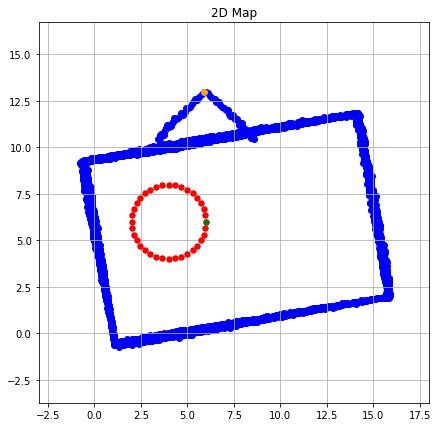

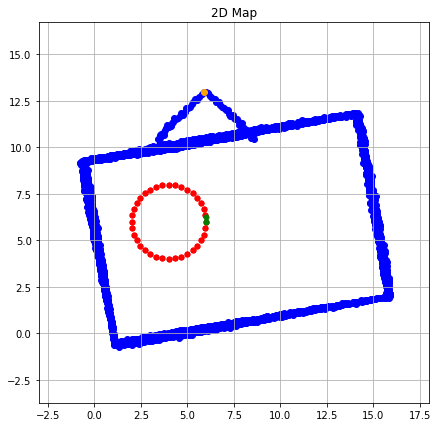

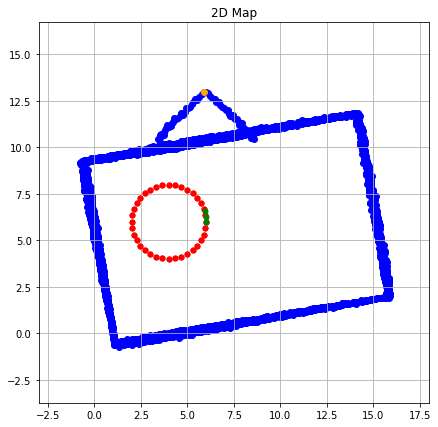

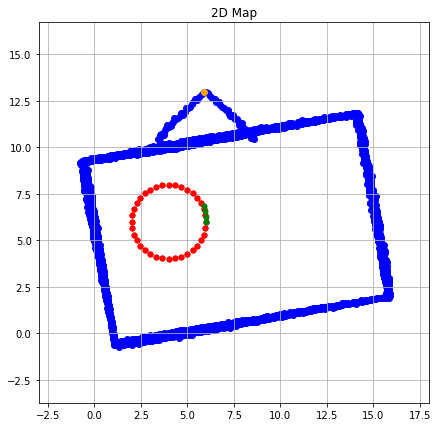

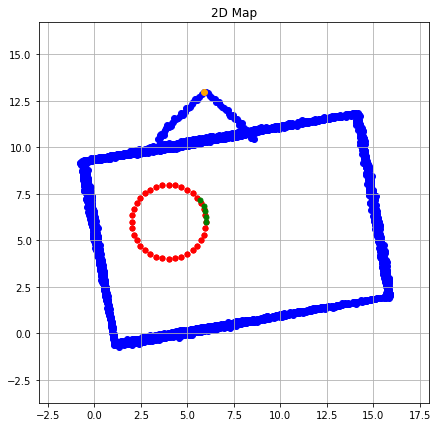

...

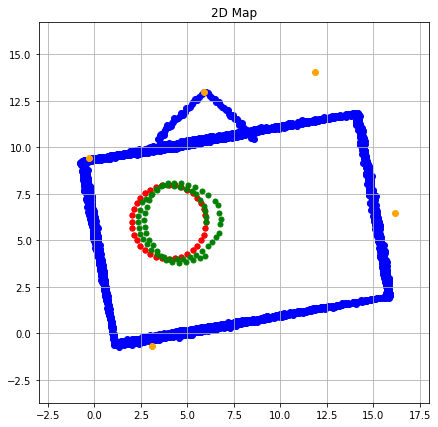

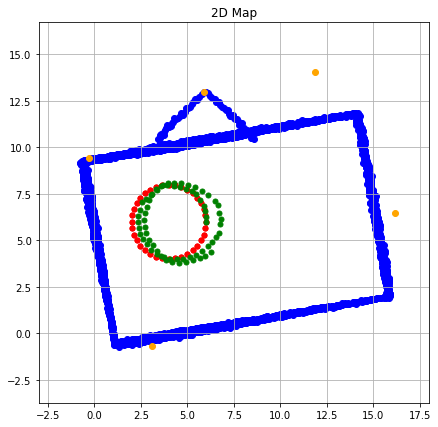

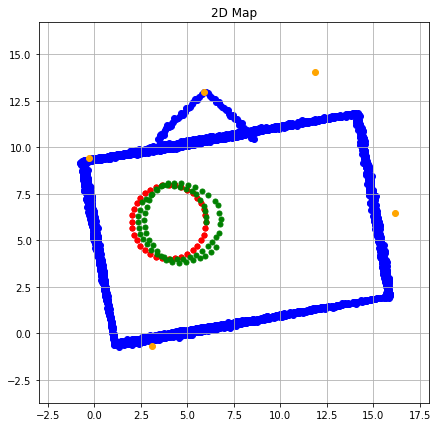

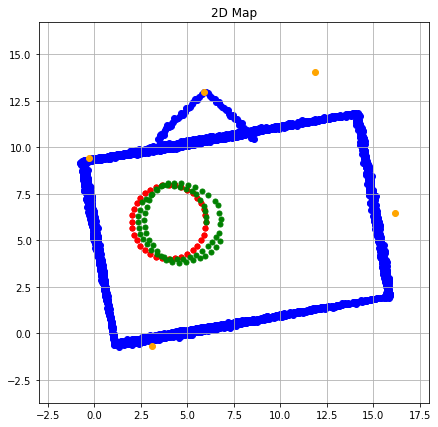

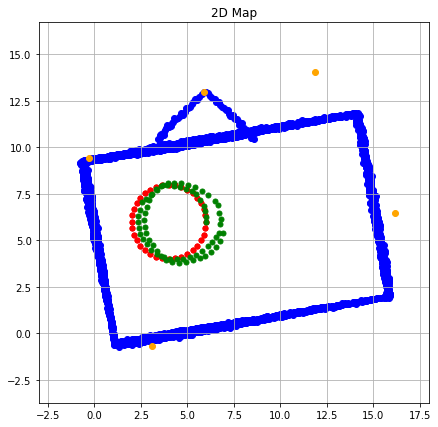

In [ ]:
# Predict Function
def kf_predict(X, P, DX, Q):
    #Position Increment
    X = X + DX
    P = P + Q
    return(X,P)


# Predict Function
def kf_update(X, P, Y, H, R, HX):

    YHX = Y - HX
    while(YHX[1] > np.pi):
      YHX[1]=YHX[1] - 2*pi
    while(YHX[1] < -np.pi):
      YHX[1]=YHX[1] + 2*pi

    IS = H @ P @ H.T + R
    K = P @ H.T @ np.linalg.inv(IS)
    X = X + K @ YHX
    P = P - K @ IS @ K.T 

    return (X,P)

#Known Corner detection function
def knownCorner(p,lst):
  threshold=5
  flag=0
  if(len(lst) == 0):
    return flag
  else:
    for i in range(1,(len(lst)+1)):
      #Check if the point is close to any of the known corners
      dist=((p[0]-lst[i-1][0])**2 + (p[1]-lst[i-1][1])**2)**(0.5)
      if(dist<threshold):
        #If it is return the corner index as a flag
        flag = i
      #If it isn't the flag value will be 0
  return flag


#Get the data set infos

# Variable Initialization 

P = Q = np.array([[sigma_sq_x,0.0         ,              0.0], 
                 [0.0,         sigma_sq_y,              0.0], 
                 [0.0,         0.0,          sigma_sq_theta]])

X = np.array([[px[0]], 
              [py[0]], 
              [th[0]]])

DX = np.array([[0.0], 
               [0.0], 
               [0.0]])

Y = np.array([[0.0],  
              [0.0]])

H = np.array([[0.0,0.0,0.0],  
              [0.0,0.0,0.0]])

R = np.array([[5.0,0.0],  
              [0.0,5.0]])


n_features=0
Kncorner=[]
Kncorner_r_alpha = []
all_corners=[]
corners_x,corners_y=[],[]
p_x, p_y, p_theta = [],[],[]

for k in range(len(Lidar_range)):
  
  #Is it a corner?
  if corner_flags[k]:
    #Compute the Estimated Corner Position
    x_corner= X[0] + corners_r[k] * np.cos(X[2] + np.deg2rad(corners_alpha[k]))
    y_corner= X[1] + corners_r[k] * np.sin(X[2] + np.deg2rad(corners_alpha[k]))

    [c0]= x_corner
    [c1]= y_corner
    corner = np.array([[c0],[c1]])
    all_corners.append(corner)
    #Is it a known corner? (returns the corner number (1,2,3,4,...) or if it doesn't exist returns 0) 
    corner_n = knownCorner(corner,Kncorner)
    #print(corner_n)

    #If it isn't
    if(corner_n == 0):
      KC=[]
      Kncorner=[]

      #Add corner to X
      X=np.append(X,corner,axis=0)

      empty=np.zeros((2,1))
      DX = np.append(DX,empty,axis=0)

      tile_r=np.zeros((P.shape[0],2))
      tile_d=np.zeros((2,P.shape[0]+2))
      P = np.append(P,tile_r,axis=1)
      P = np.append(P,tile_d,axis=0)
      P[P.shape[0]-2,P.shape[1]-2] = P[0][0]
      P[P.shape[0]-1,P.shape[1]-1] = P[1][1]


      tile_r=np.zeros((Q.shape[0],2))
      tile_d=np.zeros((2,Q.shape[0]+2))
      Q = np.append(Q,tile_r,axis=1)
      Q = np.append(Q,tile_d,axis=0)
      Q[Q.shape[0]-2,Q.shape[1]-2] = sigma_sq_x
      Q[Q.shape[0]-1,Q.shape[1]-1] = sigma_sq_x


      #Increase the number of features
      n_features=n_features+1

      #Update the Kn corners list
      KC = X[3:,:]
      for i in range(1,KC.shape[0],2):
        [xc]=KC[i-1]
        [yc]=KC[i]
        c=np.array([[xc],[yc]])
        Kncorner.append(c)

    else:
      #Get the corner that is already known
      feature = Kncorner[corner_n-1]
      
      [xb]=feature[0]
      [yb]=feature[1]

      #Transform the corner to (r, alpha) in order to insert into Z
      [a]= np.arctan2(yb-X[1],xb-X[0]) - X[2]
      [r]= np.sqrt((xb-X[0])**2+(yb-X[1])**2)

      Z = np.array([[r],
                    [a]])
      
      r1=corners_r[k]
      a1=np.deg2rad(corners_alpha[k])

      Y = np.array([[r1],
                    [a1]])
      
       
      #Calculate Matrix H with that corner position
      [h11]= -(xb-X[0])/np.sqrt((xb-X[0])**2+(yb-X[1])**2)
      [h12]= -(yb-X[1])/np.sqrt((xb-X[0])**2+(yb-X[1])**2)
      h13= 0.0
      [h21]=  (yb-X[1])/((xb-X[0])**2+(yb-X[1])**2)
      [h22]= -(xb-X[0])/((xb-X[0])**2+(yb-X[1])**2)
      h23= -1.0

      #Calculate the values of the feature
      [f11]=  (xb-X[0])/np.sqrt(((xb-X[0])**2+(yb-X[1])**2))
      [f12]=  (yb-X[1])/np.sqrt(((xb-X[0])**2+(yb-X[1])**2))
      [f21]= -(yb-X[1])/((xb-X[0])**2+(yb-X[1])**2)
      [f22]=  (xb-X[0])/((xb-X[0])**2+(yb-X[1])**2)
      
      H = np.array([[h11,h12,h13],  
                    [h21,h22,h23]])
      
      F= np.array([[f11,f12],  
                   [f21,f22]])
      
      empty=np.zeros((2,2))

      for i in range(n_features):
        if(i+1 != corner_n):
          H = np.append(H,empty,axis=1)
        else:
          H = np.append(H,F,axis=1)
        

      X,P = kf_update(X, P, Y, H, R, Z)#mexi na identação desta celula

  p_x.append(X[0])
  p_y.append(X[1])
  p_theta.append(X[2])


  DX[0]=x_delta[k]
  DX[1]=y_delta[k]
  DX[2]=th_delta[k]
  X,P = kf_predict(X,P,DX,Q)

  fig, ax = plt.subplots(figsize=(7,7))
  ax.axis('equal')
  plt.xlim(-3,18)
  plt.ylim(-5,18)
  plt.plot(px, py, 'r.', ms=10)  #estimate position of the robot
  plt.plot(p_x, p_y, 'g.', ms=10)  #estimate position of the robot
  plt.scatter(border_x, border_y, color='b', label="Map borders plot")
  for i in range(len(Kncorner)):
    plt.scatter(Kncorner[i][0],Kncorner[i][1],color='orange')
  
  plt.grid()
  plt.title('2D Map');